# Rain Prediction in Australia With EDA + Preprocessing + FE + Modelling


The [Rain in Australia dataset](https://kaggle.com/jsphyg/weather-dataset-rattle-package) contains about 10 years of daily weather observations from numerous Australian weather stations.

I will try to answer the question that whether or not it will rain tomorrow in Australia. I  implement Logistic Regression with Python and Scikit-Learn.

To answer the question, we build a classifier to predict whether or not it will rain tomorrow in Australia. We train a binary classification model using Logistic Regression. I have used the Rain in Australia dataset for this project.


<img src="https://acegif.com/wp-content/uploads/rainy-10.gif" width="480">




                                                                                                              Ruchir Mandora

## 1. Downloading dataset directly from `Kaggle` using `opendatasets` library

In [1]:
import opendatasets as od  

In [2]:
od.version()

'0.1.20'

The dataset can now be downloaded using od.download

In [3]:
dataset_url = 'https://www.kaggle.com/jsphyg/weather-dataset-rattle-package'

In [4]:
od.download(dataset_url)

Skipping, found downloaded files in ".\weather-dataset-rattle-package" (use force=True to force download)


Once the above command is executed, the dataset is downloaded and extracted to the the directory `weather-dataset-rattle-package`.

## 2. Importing necessary libraries

In [5]:
import os
import pandas as pd
import numpy as np

import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10,6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)


## 3. Loading Dataset

In [6]:
data_dir = './weather-dataset-rattle-package'

In [7]:
os.listdir(data_dir)

['weatherAUS.csv']

In [8]:
train_csv = data_dir + '/weatherAUS.csv'

In [9]:
raw_df = pd.read_csv(train_csv)

## 4. Exploratory Data Analysis and Visualization

Before training a machine learning model, its always a good idea to explore the distributions of various columns and see how they are related to the target column. Let's explore and visualize the data using the `Plotly`, `Matplotlib` and `Seaborn` libraries. 

#### 4.1 View dimensions of dataset

In [10]:
raw_df.shape

(145460, 23)

The dataset contains over `145460` rows and `23` columns. 

#### 4.2 Preview the dataset 

In [11]:
raw_df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
145456,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
145458,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


#### 4.3 View column names

In [12]:
raw_df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

The dataset contains date, numeric and categorical columns. My objective is to create a model to predict the value in the column `RainTomorrow`.



#### 4.4 View statistical properties of dataset 

In [13]:
raw_df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000


#### Important points to note

* The above command raw_df.describe() helps us to view the statistical properties of numerical variables. It excludes character variables.

* If we want to view the statistical properties of character variables, we should run the following command -

                `raw_df.describe(include=['object'])`

* If we want to view the statistical properties of all the variables, we should run the following command -

                 `raw_df.describe(include='all')`

#### 4.5 View summary of dataset 


In [14]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

We can see that the dataset contains mixture of `categorical` and `numerical` variables.

* Categorical variables have data type object.

* Numerical variables have data type float64.

Also, there are some missing values in the dataset

#### 4.6  Visualizing Missing Values 

<AxesSubplot:>

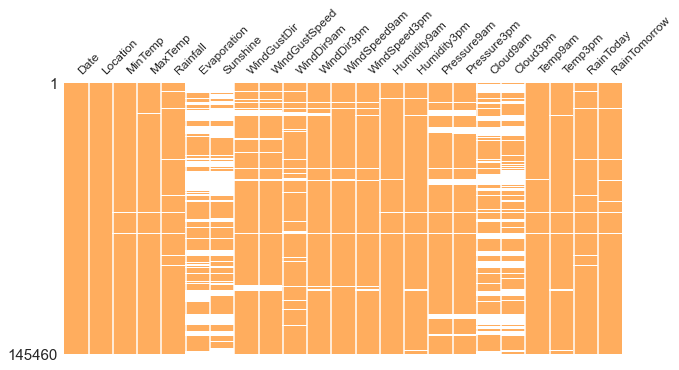

In [15]:
import missingno as msno
msno.matrix( raw_df,sparkline=False, figsize=(10,5), fontsize=12, color=(1, 0.68, 0.37))

<AxesSubplot:>

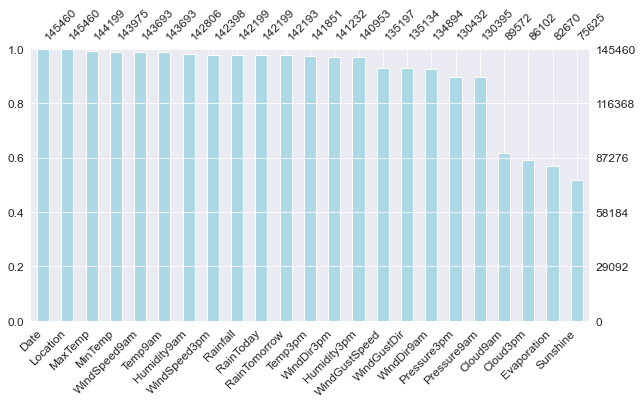

In [16]:
msno.bar(raw_df, sort= 'descending', color="LightBlue",  figsize=(10,5), fontsize=12)

From the above plot, we can see that `Cloud9am`, `Cloud3pm`, `Evaporation`, and `Sunshine` have a lot of missing values.

## 5. Univariate Analysis

### 5.1 Explore `RainTomorrow` target variable 

#### Check for missing values


In [17]:
raw_df['RainTomorrow'].isnull().sum()

3267

We can see that there are `3267` missing values in the `RainTomorrow` target variable

#### View number of unique values

In [18]:
raw_df['RainTomorrow'].nunique()

2

We can see that the number of unique values in `RainTomorrow` variable is 2.

#### View the unique values

In [19]:
raw_df['RainTomorrow'].unique()

array(['No', 'Yes', nan], dtype=object)

The three unique values are `No` , `Yes` and `nan`

#### View the frequency distribution of values

In [20]:
raw_df['RainTomorrow'].value_counts()

No     110316
Yes     31877
Name: RainTomorrow, dtype: int64

#### View percentage of frequency distribution of values

In [21]:
raw_df['RainTomorrow'].value_counts()/len(raw_df)

No     0.758394
Yes    0.219146
Name: RainTomorrow, dtype: float64

We can see that out of the total number of RainTomorrow values, No appears `75.83%` times and Yes appears `21.91%` times.

While we should be able to fill in missing values for most columns, it might be a good idea to discard the rows where the value of RainTomorrow or RainToday is missing to make our analysis and modeling simpler (since one of them is the target variable, and the other is likely to be very closely related to the target variable).

In [22]:
raw_df.dropna(subset=['RainToday', 'RainTomorrow'], inplace=True)

#### Check for missing values again

In [23]:
raw_df['RainTomorrow'].isnull().sum()

0

No missing values

#### View the unique values again

In [24]:
raw_df['RainTomorrow'].unique()

array(['No', 'Yes'], dtype=object)

The two unique values are No and Yes.

### 5.2 Visualization of Rainfall By Date

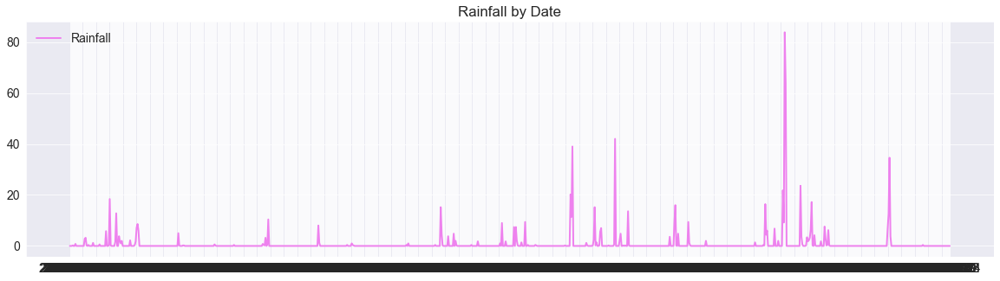

In [25]:
df_dateplot = raw_df.iloc[-950:,:]
plt.figure(figsize=[20,5])
plt.plot(df_dateplot['Date'],df_dateplot['Rainfall'],color='violet', linewidth=2, label= 'Rainfall')
plt.legend(loc='upper left', frameon=False)
plt.title('Rainfall by Date')
plt.show()

Being situated in southern hemisphere, the majority of rainfall occurs between December and March.As you can see from above plot, we can see that Dec-Jan does get a lot of rainfall but there are months like Jun-Jul when rainfall occurs too.

### 5.3 Visualization of WindGustSpeed By Date

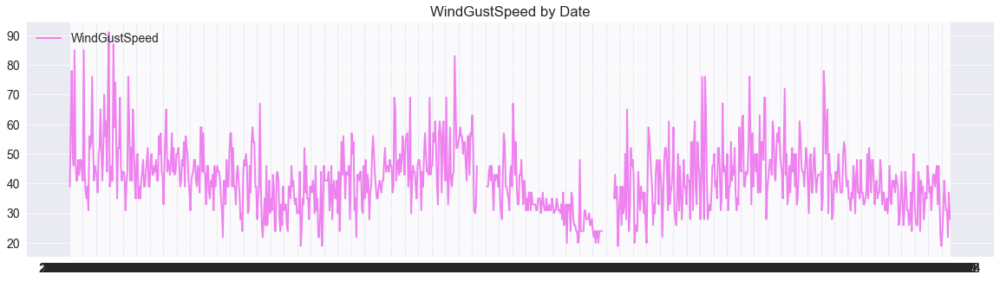

In [26]:
df_dateplot = raw_df.iloc[-950:,:]
plt.figure(figsize=[20,5])
plt.plot(df_dateplot['Date'],df_dateplot['WindGustSpeed'],color='violet', linewidth=2, label= 'WindGustSpeed')
plt.legend(loc='upper left', frameon=False)
plt.title('WindGustSpeed by Date')
plt.show()

In Australia, wind speed is usually moderate. But, from above plot we can see that Dec-Feb is the windiest months.

### 5.4 Visualization of  Frequency distribution of RainTomorrow variable

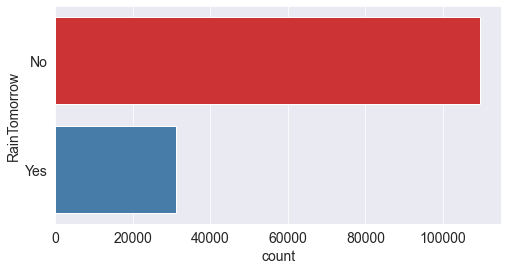

In [27]:
f, ax = plt.subplots(figsize=(8, 4))
ax = sns.countplot(y="RainTomorrow", data=raw_df, palette="Set1")
plt.show()

### 5.5 Findings of Univariate Analysis 

* The number of unique values in `RainTomorrow` variable is 2.

* The two unique values are `No` and `Yes`.

* Out of the total number of `RainTomorrow` values, `No` appears `77.58%` times and `Yes` appears `22.42%` times.

* The univariate plot confirms our findings that –

    * The No variable have 110316 entries, and

    * The Yes variable have 31877 entries.

## 6. Bivariate Analysis

Types of variables 
In this section, I segregate the dataset into categorical and numerical variables. There are a mixture of categorical and numerical variables in the dataset. Categorical variables have data type object. Numerical variables have data type float64.

First of all, I will find categorical variables.

#### 6.1 Explore Categorical Variables 

In [28]:
categorical = [var for var in raw_df.columns if raw_df[var].dtype=='O']

print('There are {} categorical variables\n'.format(len(categorical)))

print('The categorical variables are :', categorical)

There are 7 categorical variables

The categorical variables are : ['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


#### 6.2 View the categorical variables

In [29]:
raw_df[categorical].head()

,Date,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,W,W,WNW,No,No
1,2008-12-02,Albury,WNW,NNW,WSW,No,No
2,2008-12-03,Albury,WSW,W,WSW,No,No
3,2008-12-04,Albury,NE,SE,E,No,No
4,2008-12-05,Albury,W,ENE,NW,No,No


#### 6.3  Summary of categorical variables 

* There is a date variable. It is denoted by `Date` column.
* There are 6 categorical variables. These are given by `Location`, `WindGustDir`, `WindDir9am`, `WindDir3pm`, `RainToday` and `RainTomorrow`.
* There are two binary categorical variables - `RainToday` and `RainTomorrow`.
* `RainTomorrow` is the `target variable`.

#### 6.4 Explore problems within categorical variables

First, I will explore the categorical variables.

#### Missing values in categorical variables

In [30]:
raw_df[categorical].isnull().sum()

Date               0
Location           0
WindGustDir     9163
WindDir9am      9660
WindDir3pm      3670
RainToday          0
RainTomorrow       0
dtype: int64

#### Print categorical variables containing missing values

In [31]:
cat1 = [var for var in categorical if raw_df[var].isnull().sum()!=0]

print(raw_df[cat1].isnull().sum())

WindGustDir    9163
WindDir9am     9660
WindDir3pm     3670
dtype: int64


We can see that there are only 3 categorical variables in the dataset which contains missing values. These are `WindGustDir`, `WindDir9am`and `WindDir3pm` .



Now, I will check the frequency counts of categorical variables.

#### 6.6 View frequency of categorical variables

In [32]:
for var in categorical: 
    
    print(raw_df[var].value_counts())

2017-05-13    49
2014-01-20    49
2014-11-19    49
2016-11-07    49
2014-01-11    49
              ..
2007-11-17     1
2007-11-09     1
2007-11-06     1
2007-12-25     1
2008-01-29     1
Name: Date, Length: 3436, dtype: int64
Canberra            3402
Sydney              3331
Perth               3193
Darwin              3192
Hobart              3183
Brisbane            3132
Bendigo             3030
Townsville          3027
AliceSprings        3025
MountGambier        3022
Adelaide            3020
Launceston          3020
Ballarat            3017
MelbourneAirport    3009
PerthAirport        3009
Mildura             3005
SydneyAirport       3001
Albany              2996
Nuriootpa           2996
Sale                2992
Albury              2991
Watsonia            2990
Portland            2984
Woomera             2984
Cobar               2980
Cairns              2964
Tuggeranong         2959
WaggaWagga          2958
NorfolkIsland       2944
Wollongong          2943
SalmonGums          2941

#### 6.7 View frequency distribution of categorical variables

In [33]:
for var in categorical: 
    
    print(raw_df[var].value_counts()/np.float(len(raw_df)))

2017-05-13    0.000348
2014-01-20    0.000348
2014-11-19    0.000348
2016-11-07    0.000348
2014-01-11    0.000348
                ...   
2007-11-17    0.000007
2007-11-09    0.000007
2007-11-06    0.000007
2007-12-25    0.000007
2008-01-29    0.000007
Name: Date, Length: 3436, dtype: float64
Canberra            0.024164
Sydney              0.023660
Perth               0.022680
Darwin              0.022673
Hobart              0.022609
Brisbane            0.022246
Bendigo             0.021522
Townsville          0.021501
AliceSprings        0.021486
MountGambier        0.021465
Adelaide            0.021451
Launceston          0.021451
Ballarat            0.021430
MelbourneAirport    0.021373
PerthAirport        0.021373
Mildura             0.021344
SydneyAirport       0.021316
Albany              0.021280
Nuriootpa           0.021280
Sale                0.021252
Albury              0.021245
Watsonia            0.021238
Portland            0.021195
Woomera             0.021195
Cobar     

<ipython-input-33-984c093d5911>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  print(raw_df[var].value_counts()/np.float(len(raw_df)))


Number of labels: `Cardinality`

The number of labels within a categorical variable is known as `cardinality`. A high number of labels within a variable is known as `high cardinality`. High cardinality may pose some serious problems in the machine learning model. So, I will check for high cardinality.

#### 6.8 Check for cardinality in categorical variables


In [34]:

for var in categorical:
    
    print(var, ' contains ', len(raw_df[var].unique()), ' labels')

Date  contains  3436  labels
Location  contains  49  labels
WindGustDir  contains  17  labels
WindDir9am  contains  17  labels
WindDir3pm  contains  17  labels
RainToday  contains  2  labels
RainTomorrow  contains  2  labels


We can see that there is a `Date` variable which needs to be`preprocessed`. I will do preprocessing in the following section.

All the other variables contain relatively smaller number of variables.



#### 6.9 Feature Engineering of Date Variable

In [35]:
raw_df['Date'].dtypes

dtype('O')

We can see that the data type of `Date` variable is object. I will parse the date currently coded as object into `datetime` format.

#### 6.10 Parse the dates, currently coded as strings, into datetime format


In [36]:
raw_df['Date'] = pd.to_datetime(raw_df['Date'])

#### Extract year from date

In [37]:
raw_df['Year'] = raw_df['Date'].dt.year

raw_df['Year'].head()

0    2008
1    2008
2    2008
3    2008
4    2008
Name: Year, dtype: int64

#### Extract month from date

In [38]:
raw_df['Month'] = raw_df['Date'].dt.month

raw_df['Month'].head()

0    12
1    12
2    12
3    12
4    12
Name: Month, dtype: int64

#### Extract day from date

In [39]:
raw_df['Day'] = raw_df['Date'].dt.day

raw_df['Day'].head()

0    1
1    2
2    3
3    4
4    5
Name: Day, dtype: int64

#### 6.11 Distribution of Date

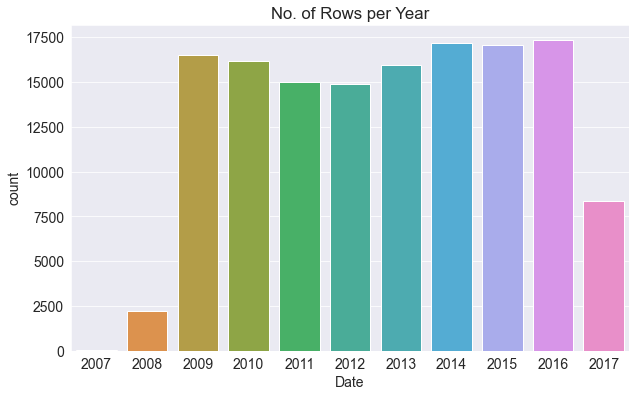

In [40]:
plt.title('No. of Rows per Year')
sns.countplot(x=pd.to_datetime(raw_df.Date).dt.year);

#### Again view the summary of dataset

In [41]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 140787 entries, 0 to 145458
Data columns (total 26 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   Date           140787 non-null  datetime64[ns]
 1   Location       140787 non-null  object        
 2   MinTemp        140319 non-null  float64       
 3   MaxTemp        140480 non-null  float64       
 4   Rainfall       140787 non-null  float64       
 5   Evaporation    81093 non-null   float64       
 6   Sunshine       73982 non-null   float64       
 7   WindGustDir    131624 non-null  object        
 8   WindGustSpeed  131682 non-null  float64       
 9   WindDir9am     131127 non-null  object        
 10  WindDir3pm     137117 non-null  object        
 11  WindSpeed9am   139732 non-null  float64       
 12  WindSpeed3pm   138256 non-null  float64       
 13  Humidity9am    139270 non-null  float64       
 14  Humidity3pm    137286 non-null  float64       
 15  

We can see that there are three additional columns created from `Date` variable. Now, I will drop the original Date variable from the dataset.

#### 6.12 Drop the original Date variable

In [42]:
raw_df.drop('Date', axis=1, inplace = True)


In [43]:
raw_df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,...,1007.1,8.0,NaN,16.9,21.8,No,No,2008,12,1
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,...,1007.8,NaN,NaN,17.2,24.3,No,No,2008,12,2
2,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,...,1008.7,NaN,2.0,21.0,23.2,No,No,2008,12,3
3,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,...,1012.8,NaN,NaN,18.1,26.5,No,No,2008,12,4
4,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,...,1006.0,7.0,8.0,17.8,29.7,No,No,2008,12,5


Now, we can see that the `Date` variable has been removed from the dataset.

## 7. Explore Categorical Variables one by one

Now, I will explore the categorical variables one by one.

#### Find categorical variables

In [44]:
categorical = [var for var in raw_df.columns if raw_df[var].dtype=='O']

print('There are {} categorical variables\n'.format(len(categorical)))

print('The categorical variables are :', categorical)

There are 6 categorical variables

The categorical variables are : ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


We can see that there are 6 categorical variables in the dataset. The Date variable has been removed. First, I will check missing values in categorical variables.

#### Check for missing values in categorical variables 

In [45]:
raw_df[categorical].isnull().sum()

Location           0
WindGustDir     9163
WindDir9am      9660
WindDir3pm      3670
RainToday          0
RainTomorrow       0
dtype: int64

We can see that `WindGustDir`, `WindDir9am`and `WindDir3pm` variables contain missing values. I will explore these variables one by one.

### 7.1 Explore Location variable

#### Print number of labels in Location variable


In [46]:
raw_df.Location.nunique() # will tell how many locations do we have 

49

#### Check labels in location variable

In [47]:
raw_df.Location.unique()

array(['Albury', 'BadgerysCreek', 'Cobar', 'CoffsHarbour', 'Moree',
       'Newcastle', 'NorahHead', 'NorfolkIsland', 'Penrith', 'Richmond',
       'Sydney', 'SydneyAirport', 'WaggaWagga', 'Williamtown',
       'Wollongong', 'Canberra', 'Tuggeranong', 'MountGinini', 'Ballarat',
       'Bendigo', 'Sale', 'MelbourneAirport', 'Melbourne', 'Mildura',
       'Nhil', 'Portland', 'Watsonia', 'Dartmoor', 'Brisbane', 'Cairns',
       'GoldCoast', 'Townsville', 'Adelaide', 'MountGambier', 'Nuriootpa',
       'Woomera', 'Albany', 'Witchcliffe', 'PearceRAAF', 'PerthAirport',
       'Perth', 'SalmonGums', 'Walpole', 'Hobart', 'Launceston',
       'AliceSprings', 'Darwin', 'Katherine', 'Uluru'], dtype=object)

#### Check frequency distribution of values in Location variable

In [48]:
raw_df.Location.value_counts()

Canberra            3402
Sydney              3331
Perth               3193
Darwin              3192
Hobart              3183
Brisbane            3132
Bendigo             3030
Townsville          3027
AliceSprings        3025
MountGambier        3022
Adelaide            3020
Launceston          3020
Ballarat            3017
MelbourneAirport    3009
PerthAirport        3009
Mildura             3005
SydneyAirport       3001
Albany              2996
Nuriootpa           2996
Sale                2992
Albury              2991
Watsonia            2990
Portland            2984
Woomera             2984
Cobar               2980
Cairns              2964
Tuggeranong         2959
WaggaWagga          2958
NorfolkIsland       2944
Wollongong          2943
SalmonGums          2941
CoffsHarbour        2940
Dartmoor            2939
Newcastle           2929
GoldCoast           2924
Witchcliffe         2924
Penrith             2911
Richmond            2906
NorahHead           2888
BadgerysCreek       2877


####  One Hot Encoding of Location variable

Since machine learning models can only be trained with numeric data, we need to convert categorical data to numbers. A common technique is to use one-hot encoding for categorical columns.One hot encoding involves adding a new binary (0/1) column for each unique category of a categorical column.

* Get k-1 dummy variables after One Hot Encoding 
* Preview the dataset with head() method

In [49]:
pd.get_dummies(raw_df.Location, drop_first=True).head()

,Albany,Albury,AliceSprings,BadgerysCreek,Ballarat,Bendigo,Brisbane,Cairns,Canberra,Cobar,...,Townsville,Tuggeranong,Uluru,WaggaWagga,Walpole,Watsonia,Williamtown,Witchcliffe,Wollongong,Woomera
0,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [50]:
px.histogram(raw_df, x ='Location' , title = 'Location vs Rainy Days' , color = 'RainToday')

#### Interpretation

For almost every location we have value of around `3000`. For some of locations value is lower probably data may have lost or not collected. We getting a sense that we having mostly a `Uniform distribution` across different locations. I have split the bars to show weather the value of `RainToday` is No or Yes. About `15-20 %` of days in pretty much every there was rain and in `70-80%` there was no rain.So Location definetly seems to be factor that decides how much rain there is goint to be.


### 7.2 Explore WindGustDir variable

#### Print number of labels in WindGustDir variable

In [51]:
print('WindGustDir contains', len(raw_df['WindGustDir'].unique()), 'labels')

WindGustDir contains 17 labels


#### Check labels in WindGustDir variable

In [52]:
raw_df['WindGustDir'].unique()

array(['W', 'WNW', 'WSW', 'NE', 'NNW', 'N', 'NNE', 'SW', 'ENE', 'SSE',
       'S', 'NW', 'SE', 'ESE', nan, 'E', 'SSW'], dtype=object)

#### Check frequency distribution of values in WindGustDir variable

In [53]:
raw_df.WindGustDir.value_counts()

W      9696
SE     9241
E      8985
N      8941
SSE    8905
S      8859
WSW    8802
SW     8702
SSW    8541
WNW    7960
NW     7939
ENE    7924
ESE    7244
NE     7002
NNW    6511
NNE    6372
Name: WindGustDir, dtype: int64

####  One Hot Encoding of Location variable

Since machine learning models can only be trained with numeric data, we need to convert categorical data to numbers.

* Get k-1 dummy variables after One Hot Encoding 
* Also add an additional dummy variable to indicate there was missing data
* Preview the dataset with head() method



In [54]:
pd.get_dummies(raw_df.WindGustDir, drop_first=True, dummy_na=True).head()


,ENE,ESE,N,NE,NNE,NNW,NW,S,SE,SSE,SSW,SW,W,WNW,WSW,NaN
0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0


* Sum the number of 1s per boolean variable over the rows of the dataset
* It will tell us how many observations we have for each category


In [55]:
pd.get_dummies(raw_df.WindGustDir, drop_first=True, dummy_na=True).sum(axis=0)

ENE    7924
ESE    7244
N      8941
NE     7002
NNE    6372
NNW    6511
NW     7939
S      8859
SE     9241
SSE    8905
SSW    8541
SW     8702
W      9696
WNW    7960
WSW    8802
NaN    9163
dtype: int64

We can see that there are 9163 missing values in `WindGustDir` variable

In [56]:
from windrose import WindroseAxes

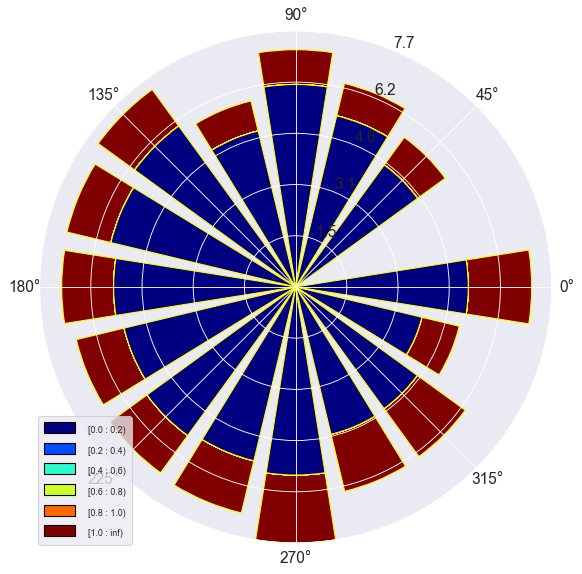

In [57]:
# create a dict for WindGustDir to numeric values
wind_dir = ['E', 'ENE', 'NE', 'NNE', 'N', 'NNE', 'NW', 'WNW', 'W', 'WSW', 'SW', 'SSW', 'S', 'SSE', 'SE', 'ESE']
degrees = np.arange(0, 360, 22.5)
wind_dir_deg = dict((zip(wind_dir, degrees)))

# plot and map WindGustDir to the dict

ax = WindroseAxes.from_ax()
ax.bar(direction=raw_df.WindGustDir.map(wind_dir_deg), var=raw_df.RainTomorrow.map({'No': 0, 'Yes': 1}), normed=True, opening=0.8, edgecolor='Yellow')
#ax.bar(direction=raw_df.WindGustDir.map(wind_dir_deg), var=raw_df.Rainfall, normed=True, opening=0.8, edgecolor='white')
ax.set_legend()

### 7.3 Explore WindDir9am variable

#### Print number of labels in WindDir9am variable

In [58]:
print('WindDir9am contains', len(raw_df['WindDir9am'].unique()), 'labels')

WindDir9am contains 17 labels


#### Check labels in WindDir9am variable

In [59]:
raw_df['WindDir9am'].unique()

array(['W', 'NNW', 'SE', 'ENE', 'SW', 'SSE', 'S', 'NE', 'SSW', 'N', 'WSW',
       'ESE', 'E', nan, 'NW', 'WNW', 'NNE'], dtype=object)

#### Check frequency distribution of values in WindDir9am variable


In [60]:
raw_df['WindDir9am'].value_counts()

N      11266
SE      9116
E       8977
SSE     8901
NW      8471
S       8424
W       8207
SW      8160
NNE     7877
NNW     7782
ENE     7668
ESE     7518
NE      7477
SSW     7397
WNW     7100
WSW     6786
Name: WindDir9am, dtype: int64

####  One Hot Encoding of Location variable

Since machine learning models can only be trained with numeric data, we need to convert categorical data to numbers.

* Get k-1 dummy variables after One Hot Encoding 
* Also add an additional dummy variable to indicate there was missing data
* Preview the dataset with head() method


In [61]:
pd.get_dummies(raw_df.WindDir9am, drop_first=True, dummy_na=True).head()

,ENE,ESE,N,NE,NNE,NNW,NW,S,SE,SSE,SSW,SW,W,WNW,WSW,NaN
0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
3,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


* Sum the number of 1s per boolean variable over the rows of the dataset
* It will tell us how many observations we have for each category


In [62]:
pd.get_dummies(raw_df.WindDir9am, drop_first=True, dummy_na=True).sum(axis=0)

ENE     7668
ESE     7518
N      11266
NE      7477
NNE     7877
NNW     7782
NW      8471
S       8424
SE      9116
SSE     8901
SSW     7397
SW      8160
W       8207
WNW     7100
WSW     6786
NaN     9660
dtype: int64

We can see that there are `9660` missing values in the WindDir9am variable.

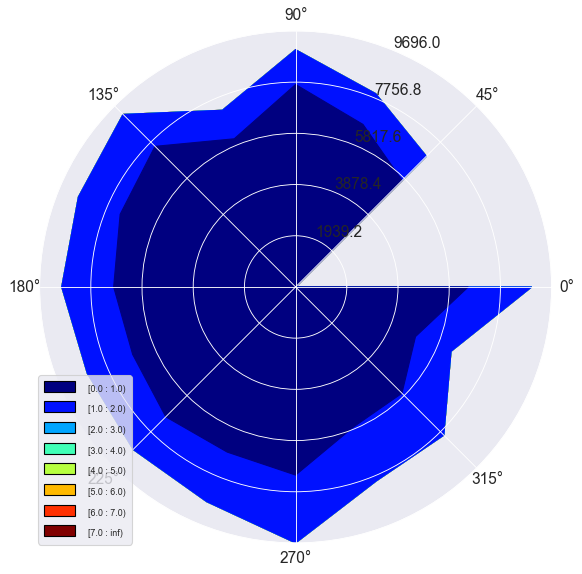

In [63]:
# create a dict for WindGustDir to numeric values

WindDir9am  =['W', 'NNW', 'SE', 'ENE', 'SW', 'SSE', 'S', 'NE', 'SSW', 'N', 'WSW','ESE', 'E',  'NW', 'WNW', 'NNE']
degrees = np.arange(0, 360, 22.5)
WindDir9am_deg = dict((zip(WindDir9am , degrees)))

# plot and map WindGustDir to the dict

ax = WindroseAxes.from_ax()
ax.contourf(direction=raw_df.WindGustDir.map(wind_dir_deg), var=raw_df.RainTomorrow.map({'No': 0, 'Yes': 1}),  bins=np.arange(0, 8, 1))
#ax.bar(direction=raw_df.WindGustDir.map(wind_dir_deg), var=raw_df.Rainfall, normed=True, opening=0.8, edgecolor='white')
ax.set_legend()

### 7.4 Explore WindDir3pm variable

#### Print number of labels in WindDir3pm variable

In [64]:
print('WindDir3pm contains', len(raw_df['WindDir3pm'].unique()), 'labels')

WindDir3pm contains 17 labels


#### Check labels in WindDir3pm variable

In [65]:
raw_df['WindDir3pm'].unique()

array(['WNW', 'WSW', 'E', 'NW', 'W', 'SSE', 'ESE', 'ENE', 'NNW', 'SSW',
       'SW', 'SE', 'N', 'S', 'NNE', nan, 'NE'], dtype=object)

#### Check frequency distribution of values in WindDir3pm variable

In [66]:
raw_df['WindDir3pm'].value_counts()

SE     10578
W       9810
S       9488
WSW     9231
SW      9104
SSE     9038
N       8593
WNW     8564
NW      8394
ESE     8311
E       8272
NE      8107
SSW     7945
NNW     7664
ENE     7645
NNE     6373
Name: WindDir3pm, dtype: int64

####  One Hot Encoding of Location variable

Since machine learning models can only be trained with numeric data, we need to convert categorical data to numbers.

* Get k-1 dummy variables after One Hot Encoding 
* Also add an additional dummy variable to indicate there was missing data
* Preview the dataset with head() method


In [67]:
pd.get_dummies(raw_df.WindDir3pm, drop_first=True, dummy_na=True).head()

,ENE,ESE,N,NE,NNE,NNW,NW,S,SE,SSE,SSW,SW,W,WNW,WSW,NaN
0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0


* Sum the number of 1s per boolean variable over the rows of the dataset
* It will tell us how many observations we have for each category


In [68]:
pd.get_dummies(raw_df.WindDir3pm, drop_first=True, dummy_na=True).sum(axis=0)

ENE     7645
ESE     8311
N       8593
NE      8107
NNE     6373
NNW     7664
NW      8394
S       9488
SE     10578
SSE     9038
SSW     7945
SW      9104
W       9810
WNW     8564
WSW     9231
NaN     3670
dtype: int64

There are `3670` missing values in the WindDir3pm variable.

### 7.5 Explore RainToday variable

#### Print number of labels in RainToday variable

In [69]:
print('RainToday contains', len(raw_df['RainToday'].unique()), 'labels')

RainToday contains 2 labels


#### Check labels in WindGustDir variable

In [70]:
raw_df['RainToday'].unique()

array(['No', 'Yes'], dtype=object)

#### Check frequency distribution of values in WindGustDir variable

In [71]:
raw_df.RainToday.value_counts()

No     109332
Yes     31455
Name: RainToday, dtype: int64

####  One Hot Encoding of Location variable

Since machine learning models can only be trained with numeric data, we need to convert categorical data to numbers.

* Get k-1 dummy variables after One Hot Encoding 
* Also add an additional dummy variable to indicate there was missing data
* Preview the dataset with head() method

In [72]:
pd.get_dummies(raw_df.RainToday, drop_first=True, dummy_na=True).head()

,Yes,NaN
0,0,0
1,0,0
2,0,0
3,0,0
4,0,0


* sum the number of 1s per boolean variable over the rows of the dataset
* it will tell us how many observations we have for each category

In [73]:
pd.get_dummies(raw_df.RainToday, drop_first=True, dummy_na=True).sum(axis=0)

Yes    31455
NaN        0
dtype: int64

There is no missing values in the `RainToday` variable.

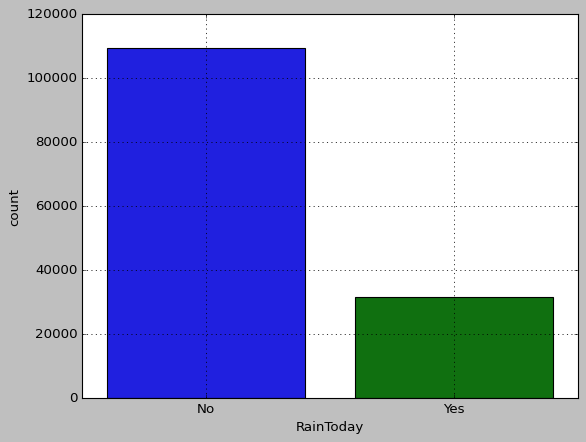

In [74]:
plt.style.use("classic")
sns.countplot(data=raw_df, x="RainToday")
plt.grid(linewidth = 0.7)
plt.show()

## 8 Comparison of  Columns Using Visualization

### 8.1 Temprature at 3 pm vs. Rain Tomorrow

In [75]:
px.histogram(raw_df,
            x='Temp3pm',
            title = ' Temprature at 3 pm vs. Rain Tomorrow',
            color='RainTomorrow')

Forming a `Gaussian distribution`.If temperature at 3pm is low temperature then it might rain tomorrow and with high temperature it might no rain tomorrow. If temperature is lower it seem more likely it will rain and there are decent example where temperature is high then also raining.

### 8.2 Rain Tomorrow vs. Rain Today

In [76]:
px.histogram(raw_df, 
             x='RainTomorrow', 
             color='RainToday', 
             title='Rain Tomorrow vs. Rain Today')

In first condition it seems like `class imbalance `  mean which having two classes yes and no where we don't have equal number of observation in each class, if its not rain today their are higher chances that it will not rain tomorrow and on the other hand  having equal chances if it did rain today it may or may not rain tomorrow and vice versa.

### 8.3 Min Temp. vs Max Temp.

In [77]:
px.scatter(raw_df.sample(2000), 
           title='Min Temp. vs Max Temp.',
           x='MinTemp', 
           y='MaxTemp', 
           color='RainToday')

It seem that when their is a rain , the temperature difference between maximum temperature and minimum temperature is significantly low.There for it may be relevant factor for rain tomorrow.

### 8.4 Temp (3 pm) vs. Humidity (3 pm)

In [78]:
px.scatter(raw_df.sample(2000), 
           title='Temp (3 pm) vs. Humidity (3 pm)',
           x='Temp3pm',
           y='Humidity3pm',
           color='RainTomorrow')

If the temperature today is low and humidity today is high , then there is high chance it may be rain tomorrow.

### 8.5 Sunshine vs Rainfall

<AxesSubplot:xlabel='Sunshine', ylabel='Rainfall'>

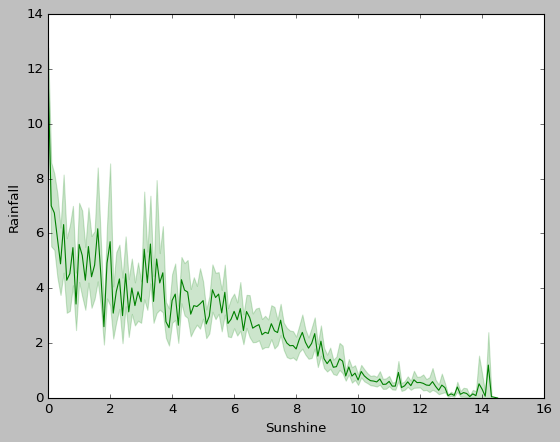

In [79]:
sns.lineplot(data=raw_df,x='Sunshine',y='Rainfall',color='green')

In the above line plot, the Sunshine feature is inversely proportional to the Rainfall feature.

### 8.6 Sunshine vs Evaporation

<AxesSubplot:xlabel='Sunshine', ylabel='Evaporation'>

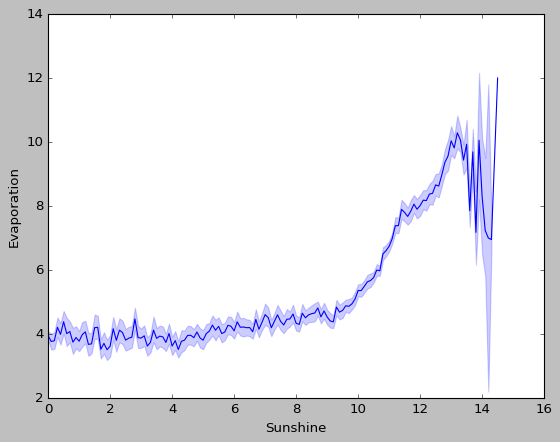

In [80]:
sns.lineplot(data=raw_df,x='Sunshine',y='Evaporation',color='blue')

In the above line plot, the Sunshine feature is proportional to the Evaporation feature.

## 9. Explore Numerical Variables 

### 9.1 Find numerical variables

In [81]:
numerical = [var for var in raw_df.columns if raw_df[var].dtype!='O']

print('There are {} numerical variables\n'.format(len(numerical)))

print('The numerical variables are :', numerical)

There are 19 numerical variables

The numerical variables are : ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'Year', 'Month', 'Day']


### 9.2 View the numerical variables

In [82]:
raw_df[numerical].head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Year,Month,Day
0,13.4,22.9,0.6,NaN,NaN,44.0,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,2008,12,1
1,7.4,25.1,0.0,NaN,NaN,44.0,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,2008,12,2
2,12.9,25.7,0.0,NaN,NaN,46.0,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,2008,12,3
3,9.2,28.0,0.0,NaN,NaN,24.0,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,2008,12,4
4,17.5,32.3,1.0,NaN,NaN,41.0,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,2008,12,5


#### Summary of numerical variables 

* There are 19 numerical variables.
* These are given by MinTemp, MaxTemp, Rainfall, Evaporation, Sunshine, WindGustSpeed, WindSpeed9am, WindSpeed3pm, Humidity9am, * Humidity3pm, Pressure9am, Pressure3pm, Cloud9am, Cloud3pm, Temp9am and Temp3pm.

All of the numerical variables are of continuous type.

#### Missing values in numerical variables

In [83]:
raw_df[numerical].isnull().sum()

MinTemp            468
MaxTemp            307
Rainfall             0
Evaporation      59694
Sunshine         66805
WindGustSpeed     9105
WindSpeed9am      1055
WindSpeed3pm      2531
Humidity9am       1517
Humidity3pm       3501
Pressure9am      13743
Pressure3pm      13769
Cloud9am         52625
Cloud3pm         56094
Temp9am            656
Temp3pm           2624
Year                 0
Month                0
Day                  0
dtype: int64

We can see that all the 15 numerical variables contain missing values.

### 9.3 Outliers in numerical variables

#### View summary statistics in numerical variables


In [84]:
print(round(raw_df[numerical].describe()),2)

        MinTemp   MaxTemp  Rainfall  Evaporation  Sunshine  WindGustSpeed  \
count  140319.0  140480.0  140787.0      81093.0   73982.0       131682.0   
mean       12.0      23.0       2.0          5.0       8.0           40.0   
std         6.0       7.0       8.0          4.0       4.0           14.0   
min        -8.0      -5.0       0.0          0.0       0.0            6.0   
25%         8.0      18.0       0.0          3.0       5.0           31.0   
50%        12.0      23.0       0.0          5.0       8.0           39.0   
75%        17.0      28.0       1.0          7.0      11.0           48.0   
max        34.0      48.0     371.0        145.0      14.0          135.0   

       WindSpeed9am  WindSpeed3pm  Humidity9am  Humidity3pm  Pressure9am  \
count      139732.0      138256.0     139270.0     137286.0     127044.0   
mean           14.0          19.0         69.0         51.0       1018.0   
std             9.0           9.0         19.0         21.0          7.0   
mi

On closer inspection, we can see that the `Rainfall`, `Evaporation`, `WindSpeed9am` and `WindSpeed3pm` columns may contain outliers.

I will draw boxplots to visualise outliers in the above variables.

### 9.4  Draw boxplots to visualize outliers

Text(0, 0.5, 'WindSpeed3pm')

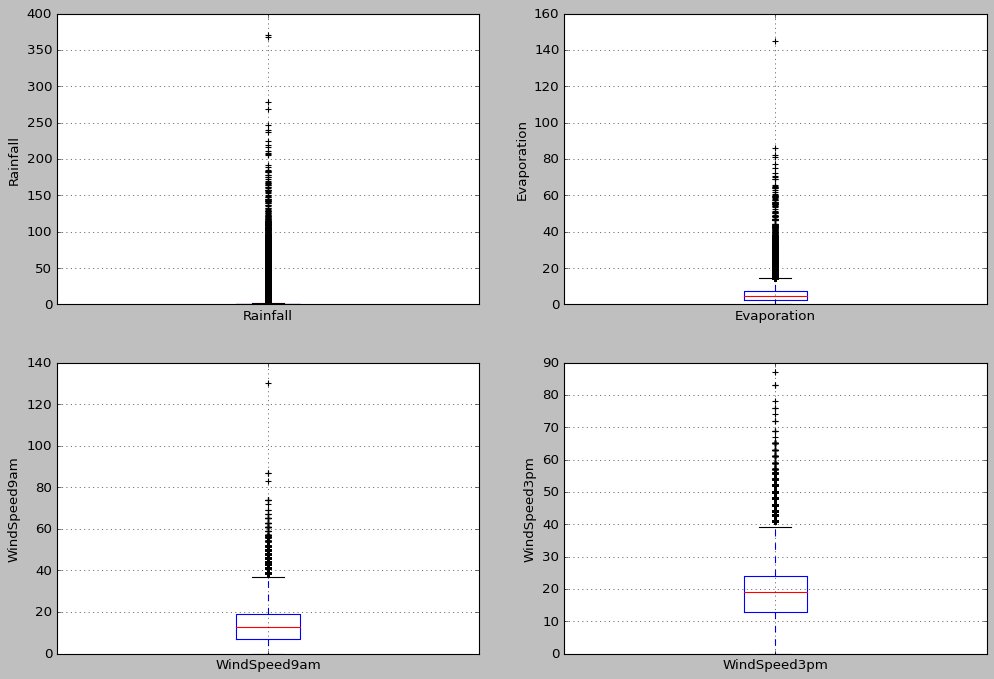

In [85]:
plt.figure(figsize=(15,10))


plt.subplot(2, 2, 1)
fig = raw_df.boxplot(column='Rainfall')
fig.set_title('')
fig.set_ylabel('Rainfall')


plt.subplot(2, 2, 2)
fig = raw_df.boxplot(column='Evaporation')
fig.set_title('')
fig.set_ylabel('Evaporation')


plt.subplot(2, 2, 3)
fig = raw_df.boxplot(column='WindSpeed9am')
fig.set_title('')
fig.set_ylabel('WindSpeed9am')


plt.subplot(2, 2, 4)
fig = raw_df.boxplot(column='WindSpeed3pm')
fig.set_title('')
fig.set_ylabel('WindSpeed3pm')

The above boxplots confirm that there are lot of `outliers` in these variables.

#### Check the distribution of variables
* Now, I will plot the `histograms` to check distributions to find out if they are `normal` or `skewed`.

* If the variable follows `normal distribution`, then I will do `Extreme Value Analysis` otherwise if they are `skewed`, I will find `IQR (Interquantile range)`.

### 9.5  Plot histogram to check distribution

Text(0, 0.5, 'RainTomorrow')

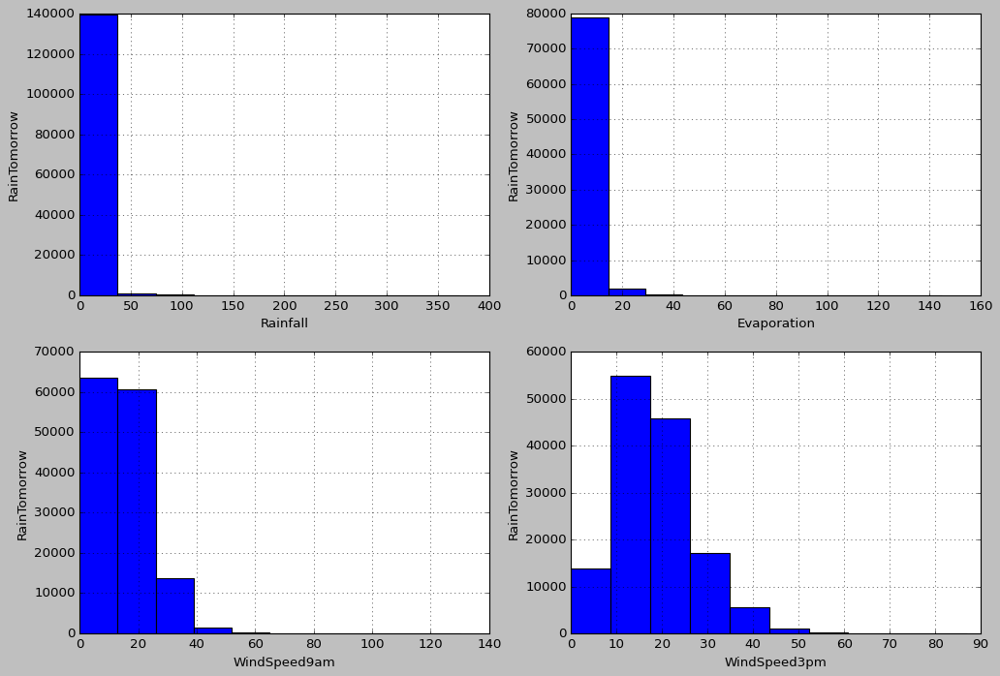

In [86]:
plt.figure(figsize=(15,10))


plt.subplot(2, 2, 1)
fig = raw_df.Rainfall.hist(bins=10)
fig.set_xlabel('Rainfall')
fig.set_ylabel('RainTomorrow')


plt.subplot(2, 2, 2)
fig = raw_df.Evaporation.hist(bins=10)
fig.set_xlabel('Evaporation')
fig.set_ylabel('RainTomorrow')


plt.subplot(2, 2, 3)
fig = raw_df.WindSpeed9am.hist(bins=10)
fig.set_xlabel('WindSpeed9am')
fig.set_ylabel('RainTomorrow')


plt.subplot(2, 2, 4)
fig = raw_df.WindSpeed3pm.hist(bins=10)
fig.set_xlabel('WindSpeed3pm')
fig.set_ylabel('RainTomorrow')

We can see that all the four variables are `skewed`. So, I will use `interquantile range` to find `outliers`.

### 9.6 Find outliers for Rainfall variable

In [87]:
IQR = raw_df.Rainfall.quantile(0.75) - raw_df.Rainfall.quantile(0.25)
Lower_fence = raw_df.Rainfall.quantile(0.25) - (IQR * 3)
Upper_fence = raw_df.Rainfall.quantile(0.75) + (IQR * 3)
print('Rainfall outliers are values < {lowerboundary} or > {upperboundary}'.format(lowerboundary=Lower_fence, upperboundary=Upper_fence))

Rainfall outliers are values < -2.4000000000000004 or > 3.2


For `Rainfall`, the `minimum` and `maximum` values are `0.0` and `371.0`. So, the `outliers` are values > `3.2`.

### 9.7 Find outliers for Evaporation variable

In [88]:
IQR = raw_df.Evaporation.quantile(0.75) - raw_df.Evaporation.quantile(0.25)
Lower_fence = raw_df.Evaporation.quantile(0.25) - (IQR * 3)
Upper_fence = raw_df.Evaporation.quantile(0.75) + (IQR * 3)
print('Evaporation outliers are values < {lowerboundary} or > {upperboundary}'.format(lowerboundary=Lower_fence, upperboundary=Upper_fence))

Evaporation outliers are values < -11.800000000000002 or > 21.800000000000004


For `Evaporation`, the `minimum` and `maximum` values are `0.0` and `145.0`. So, the `outliers` are values > `21.8`.

### 9.8 Find outliers for WindSpeed9am variable

In [89]:
IQR = raw_df.WindSpeed9am.quantile(0.75) - raw_df.WindSpeed9am.quantile(0.25)
Lower_fence = raw_df.WindSpeed9am.quantile(0.25) - (IQR * 3)
Upper_fence = raw_df.WindSpeed9am.quantile(0.75) + (IQR * 3)
print('WindSpeed9am outliers are values < {lowerboundary} or > {upperboundary}'.format(lowerboundary=Lower_fence, upperboundary=Upper_fence))

WindSpeed9am outliers are values < -29.0 or > 55.0


For `WindSpeed9am`, the `minimum` and `maximum` values are `0.0` and `130.0`. So, the `outliers` are values > `55.0`.

### 9.9  Find outliers for WindSpeed3pm variable


In [90]:
IQR = raw_df.WindSpeed3pm.quantile(0.75) - raw_df.WindSpeed3pm.quantile(0.25)
Lower_fence = raw_df.WindSpeed3pm.quantile(0.25) - (IQR * 3)
Upper_fence = raw_df.WindSpeed3pm.quantile(0.75) + (IQR * 3)
print('WindSpeed3pm outliers are values < {lowerboundary} or > {upperboundary}'.format(lowerboundary=Lower_fence, upperboundary=Upper_fence))

WindSpeed3pm outliers are values < -20.0 or > 57.0


For `WindSpeed3pm`, the `minimum` and `maximum` values are `0.0` and `87.0`. So, the `outliers` are values > `57.0`.

## 10. Multivariate Analysis

* An important step in EDA is to discover patterns and relationships between variables in the dataset.

* I will use heat map and pair plot to discover the patterns and relationships in the dataset.

* First of all, I will draw a heat map.

In [91]:
correlation = raw_df.corr()

### 10.1 Heat Map

<AxesSubplot:>

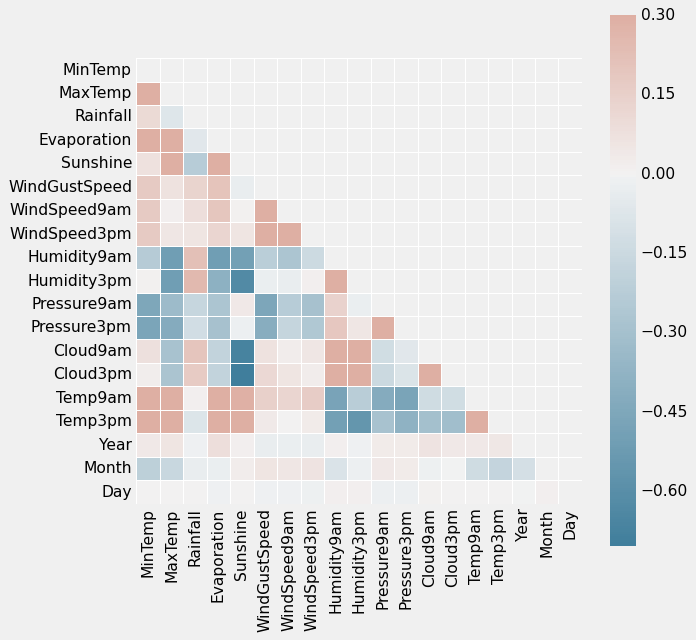

In [92]:
 plt.style.use('fivethirtyeight')
# Compute the correlation matrix
corr = raw_df.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(8, 8))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask,cmap=cmap,vmax=.3 ,center=0,square=True,linewidths=.5,cbar={"shrink": .5})

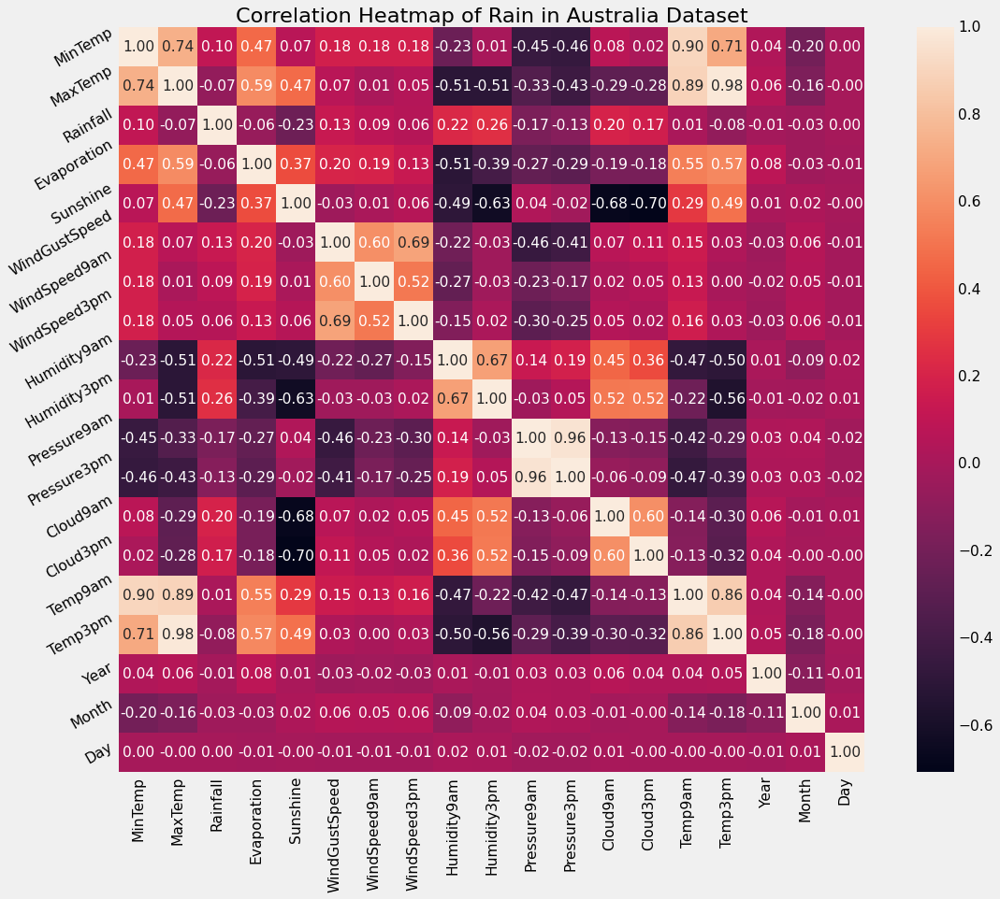

In [93]:
plt.figure(figsize=(16,12))
plt.title('Correlation Heatmap of Rain in Australia Dataset')
ax = sns.heatmap(correlation, square=True, annot=True, fmt='.2f', linecolor='white')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
ax.set_yticklabels(ax.get_yticklabels(), rotation=30)           
plt.show()

#### Interpretation

From the above correlation heat map, we can conclude that :-

* MinTemp and MaxTemp variables are `highly positively` correlated (correlation coefficient = 0.74).


* MinTemp and Temp3pm variables are also `highly positively` correlated (correlation coefficient = 0.71).


* MinTemp and Temp9am variables are `strongly positively` correlated (correlation coefficient = 0.90).


* MaxTemp and Temp9am variables are `strongly positively` correlated (correlation coefficient = 0.89).


* MaxTemp and Temp3pm variables are also `strongly positively` correlated (correlation coefficient = 0.98).


* WindGustSpeed and WindSpeed3pm variables are `highly positively` correlated (correlation coefficient = 0.69).


* Pressure9am and Pressure3pm variables are `strongly positively` correlated (correlation coefficient = 0.96).


* Temp9am and Temp3pm variables are `strongly positively` correlated (correlation coefficient = 0.86).

### 10.2 Pair Plot

First of all, I will define extract the variables which are highly positively correlated.

In [94]:
num_var = ['MinTemp', 'MaxTemp', 'Temp9am', 'Temp3pm', 'WindGustSpeed', 'WindSpeed3pm', 'Pressure9am', 'Pressure3pm']

Now, I will draw pairplot to depict relationship between these variables.

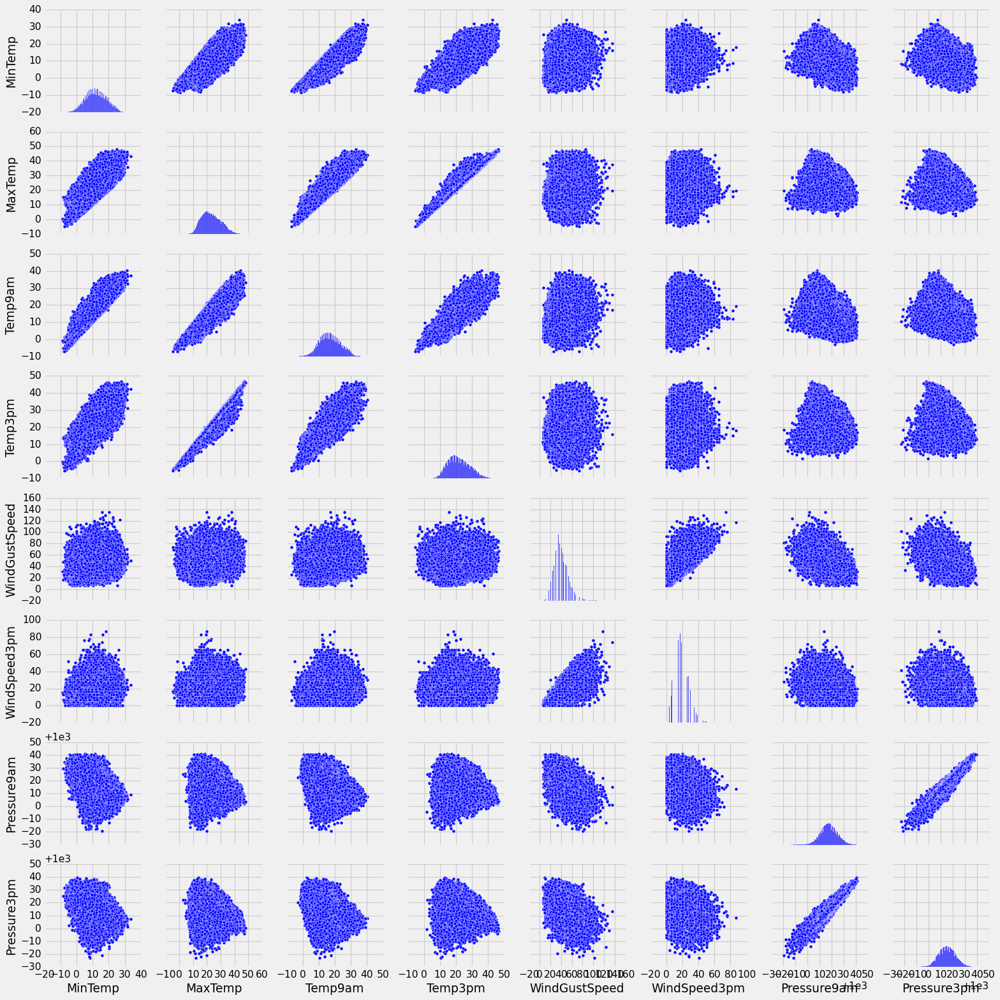

In [95]:
sns.pairplot(raw_df[num_var], kind='scatter', diag_kind='hist', palette='Rainbow')
plt.show()

#### Interpretation

* I have defined a variable `num_var` which consists of `MinTemp`, `MaxTemp`, `Temp9am`, `Temp3pm`, `WindGustSpeed`, `WindSpeed3pm`, `Pressure9am` and `Pressure3pm` variables.

* The above pair plot shows relationship between these variables.

### ---------------------------------------------------------------------------------------------------------------

## 11. Training and Test Sets

While building real-world machine learning models, it is quite common to split the dataset into  parts:

1. **Training set** - used to train the model, i.e., compute the loss and adjust the model's weights using an optimization technique. 

2. **Test set** - used to compare different models or approaches and report the model's final accuracy. For many datasets, test sets are provided separately. The test set should reflect the kind of data the model will encounter in the real-world, as closely as feasible.


<img src="https://d1m75rqqgidzqn.cloudfront.net/wp-data/2020/07/15185319/blogs-15-7-2020-02-1024x565.jpg" width="480">




As a general rule of thumb you can use around 80% of the data for the training set and 20% for the test set.


When rows in the dataset have no inherent order, it's common practice to pick random subsets of rows for creating test sets. This can be done using the `train_test_split` utility from `scikit-learn`. 

### 11.1 Declare feature vector and target variable

In [96]:
X = raw_df.drop(['RainTomorrow'], axis=1)

y = raw_df['RainTomorrow']

### 11.2  Split data into separate training and test set 

In [97]:
from sklearn.model_selection import train_test_split

Splitting entire data into training data = 80% , test data 20 %

In [98]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

Check the shape of X_train and X_test

In [99]:
X_train.shape, X_test.shape

((112629, 24), (28158, 24))

## 12. Feature Engineering 

_Feature Engineering_ is the process of transforming raw data into useful features that help us to understand our model better and increase its predictive power. I will carry out feature engineering on different types of variables.

<img src="https://www.mastersoftwaresolutions.com/wp-content/uploads/2020/01/Machine-Learning.png" width="480">


First, I will display the categorical and numerical variables again separately.

#### Check data types in X_train

In [100]:
X_train.dtypes

Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
Year               int64
Month              int64
Day                int64
dtype: object

#### Display categorical variables

In [101]:
categorical = [col for col in X_train.columns if X_train[col].dtypes == 'O']

categorical

['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday']

#### Display numerical variables

In [102]:
numerical = [col for col in X_train.columns if X_train[col].dtypes != 'O']

numerical

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm',
 'Year',
 'Month',
 'Day']

###  12.1 Imputing Missing Numeric Data

Machine learning models can't work with missing numerical data. The process of filling missing values is called `imputation.`
There are several techniques for imputation, but I'll use the most basic one: replacing missing values with the average value in the column using the `SimpleImputer` class from `sklearn.impute`.

<img src="https://cf3.ppt-online.org/files3/slide/d/D7zEN9sIYTWAw4XHKtlv1c65run8haFROqMJPQ/slide-4.jpg" width="480">

### 12.2 Engineering missing values in numerical variables 

#### Check missing values in numerical variables in X_train

In [103]:
X_train[numerical].isnull().sum()

MinTemp            366
MaxTemp            247
Rainfall             0
Evaporation      47874
Sunshine         53533
WindGustSpeed     7237
WindSpeed9am       857
WindSpeed3pm      2018
Humidity9am       1209
Humidity3pm       2768
Pressure9am      11007
Pressure3pm      11032
Cloud9am         42194
Cloud3pm         44994
Temp9am            529
Temp3pm           2083
Year                 0
Month                0
Day                  0
dtype: int64

#### Check missing values in numerical variables in X_test

In [104]:
X_test[numerical].isnull().sum()

MinTemp            102
MaxTemp             60
Rainfall             0
Evaporation      11820
Sunshine         13272
WindGustSpeed     1868
WindSpeed9am       198
WindSpeed3pm       513
Humidity9am        308
Humidity3pm        733
Pressure9am       2736
Pressure3pm       2737
Cloud9am         10431
Cloud3pm         11100
Temp9am            127
Temp3pm            541
Year                 0
Month                0
Day                  0
dtype: int64

#### Print percentage of missing values in the numerical variables in training set

In [105]:
for col in numerical:
    if X_train[col].isnull().mean()>0:
        print(col, round(X_train[col].isnull().mean(),4))

MinTemp 0.0032
MaxTemp 0.0022
Evaporation 0.4251
Sunshine 0.4753
WindGustSpeed 0.0643
WindSpeed9am 0.0076
WindSpeed3pm 0.0179
Humidity9am 0.0107
Humidity3pm 0.0246
Pressure9am 0.0977
Pressure3pm 0.0979
Cloud9am 0.3746
Cloud3pm 0.3995
Temp9am 0.0047
Temp3pm 0.0185


## Assumption

* I assume that the data are `missing completely at random (MCAR)`. There are two methods which can be used to impute missing values. One is `mean or median imputation` and other one is `random sample imputation`. When there are outliers in the dataset, we should use median imputation. So, I will use `mean imputation` because it is robust to outliers.


* I will impute missing values with the appropriate statistical measures of the data, in this case mean. 

In [106]:
from sklearn.impute import SimpleImputer 

In [107]:
imputer = SimpleImputer(strategy = 'mean')

#### Before we perform imputation, let's check the no. of `missing values` in each numeric column.

In [108]:
raw_df[numerical].isna().sum() # checking missing values from enitre dataset and counting those values

MinTemp            468
MaxTemp            307
Rainfall             0
Evaporation      59694
Sunshine         66805
WindGustSpeed     9105
WindSpeed9am      1055
WindSpeed3pm      2531
Humidity9am       1517
Humidity3pm       3501
Pressure9am      13743
Pressure3pm      13769
Cloud9am         52625
Cloud3pm         56094
Temp9am            656
Temp3pm           2624
Year                 0
Month                0
Day                  0
dtype: int64

#### These values are spread across the training and test sets. We can also check the no. of missing values individually for X_train and X_test.

In [109]:
X_train[numerical].isna().sum() # checking missing value for training data  and counting those values

MinTemp            366
MaxTemp            247
Rainfall             0
Evaporation      47874
Sunshine         53533
WindGustSpeed     7237
WindSpeed9am       857
WindSpeed3pm      2018
Humidity9am       1209
Humidity3pm       2768
Pressure9am      11007
Pressure3pm      11032
Cloud9am         42194
Cloud3pm         44994
Temp9am            529
Temp3pm           2083
Year                 0
Month                0
Day                  0
dtype: int64

In [110]:
X_test[numerical].isna().sum() # checking missing value for test data  and counting those values

MinTemp            102
MaxTemp             60
Rainfall             0
Evaporation      11820
Sunshine         13272
WindGustSpeed     1868
WindSpeed9am       198
WindSpeed3pm       513
Humidity9am        308
Humidity3pm        733
Pressure9am       2736
Pressure3pm       2737
Cloud9am         10431
Cloud3pm         11100
Temp9am            127
Temp3pm            541
Year                 0
Month                0
Day                  0
dtype: int64

#### The first step in imputation is to `fit` the imputer to the data i.e. compute the chosen statistic (e.g. mean) for each column in the dataset. 

In [111]:
imputer.fit(raw_df[numerical])

SimpleImputer()

#### After calling `fit`, the computed statistic for each column is stored in the `statistics_` property of `imputer`.

In [112]:
numerical

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm',
 'Year',
 'Month',
 'Day']

In [113]:
list(imputer.statistics_) # computed averages 

[12.18482386562048,
 23.235120301822324,
 2.349974074310839,
 5.472515506887154,
 7.630539861047281,
 39.97051988882308,
 13.990496092519967,
 18.631140782316862,
 68.82683277087672,
 51.44928834695453,
 1017.6545771543717,
 1015.2579625879797,
 4.431160817585808,
 4.499250233195188,
 16.98706638787991,
 21.69318269001107,
 2012.7574918138748,
 6.403481855569051,
 15.714703772365347]

#### The missing values in the training and test  sets can now be filled in using the `transform` method of `imputer`.

In [114]:
imputer.transform(X_train[numerical]) # replaced nan with avgs

array([[1.300e+01, 2.270e+01, 0.000e+00, ..., 2.017e+03, 6.000e+00,
        2.300e+01],
       [2.460e+01, 3.330e+01, 0.000e+00, ..., 2.013e+03, 1.100e+01,
        6.000e+00],
       [1.700e+01, 2.250e+01, 2.000e-01, ..., 2.010e+03, 4.000e+00,
        1.000e+00],
       ...,
       [1.480e+01, 2.760e+01, 0.000e+00, ..., 2.009e+03, 3.000e+00,
        1.100e+01],
       [1.580e+01, 2.200e+01, 4.400e+00, ..., 2.012e+03, 1.000e+01,
        1.400e+01],
       [1.810e+01, 2.340e+01, 2.000e-01, ..., 2.016e+03, 1.100e+01,
        2.700e+01]])

To avoid `SettingWithCopyWarning` 

In [115]:
X_train = X_train.copy()
X_test = X_test.copy()

In [116]:
X_train[numerical] = imputer.transform(X_train[numerical]) # overwriting the numeric cols with imputed numeric cols 
X_test[numerical] = imputer.transform(X_test[numerical])

In [117]:
X_train[numerical]

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Year,Month,Day
93277,13.0,22.7,0.0,5.472516,7.63054,24.0,9.0,13.0,66.0,49.0,1022.7,1018.1,4.431161,4.49925,18.2,22.3,2017.0,6.0,23.0
140976,24.6,33.3,0.0,5.000000,11.00000,37.0,13.0,22.0,68.0,57.0,1012.1,1007.9,4.000000,2.00000,29.3,32.2,2013.0,11.0,6.0
43033,17.0,22.5,0.2,5.472516,7.63054,44.0,19.0,31.0,62.0,60.0,1018.7,1016.5,4.431161,4.49925,19.2,22.0,2010.0,4.0,1.0
70218,14.8,17.8,0.4,3.000000,1.20000,39.0,9.0,19.0,83.0,73.0,1016.9,1018.9,8.000000,7.00000,15.3,16.3,2017.0,1.0,2.0
102699,3.3,15.1,0.2,2.000000,4.50000,26.0,7.0,9.0,96.0,66.0,1025.5,1023.6,6.000000,4.49925,7.9,14.2,2009.0,5.0,27.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43780,9.9,18.7,0.0,5.472516,7.63054,17.0,11.0,9.0,67.0,64.0,1024.9,1022.5,4.431161,4.49925,16.7,17.7,2012.0,5.0,17.0
101313,16.5,44.9,0.0,10.200000,10.20000,57.0,11.0,31.0,19.0,6.0,1008.3,1004.7,2.000000,6.00000,30.0,44.1,2014.0,2.0,2.0
99613,14.8,27.6,0.0,3.000000,4.60000,48.0,13.0,22.0,87.0,41.0,1019.5,1016.0,7.000000,7.00000,18.0,26.1,2009.0,3.0,11.0
122174,15.8,22.0,4.4,3.200000,4.20000,37.0,17.0,15.0,68.0,58.0,1017.3,1017.4,8.000000,7.00000,17.0,19.3,2012.0,10.0,14.0


The missing values are now filled in with the `mean` of each column.

In [118]:
X_train[numerical].isna().sum() # now no missing values

MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustSpeed    0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
Year             0
Month            0
Day              0
dtype: int64

In [119]:
X_test[numerical].isna().sum()  # now no missing values

MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustSpeed    0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
Year             0
Month            0
Day              0
dtype: int64

###  12.3 Engineering missing values in categorical variables

In [120]:
cat_imputer = SimpleImputer(strategy='constant', fill_value='not available')

#### Before we perform imputation, let's check the no. of `missing values` in each categorical column.

In [121]:
raw_df[categorical].isna().sum() # checking missing values from enitre dataset and counting those values

Location          0
WindGustDir    9163
WindDir9am     9660
WindDir3pm     3670
RainToday         0
dtype: int64

#### These values are spread across the training and test sets. We can also check the no. of missing values individually for X_train and X_test.

In [122]:
X_train[categorical].isna().sum() # checking missing value for training data  and counting those values

Location          0
WindGustDir    7285
WindDir9am     7754
WindDir3pm     2916
RainToday         0
dtype: int64

In [123]:
X_test[categorical].isna().sum() # checking missing value for test data  and counting those values

Location          0
WindGustDir    1878
WindDir9am     1906
WindDir3pm      754
RainToday         0
dtype: int64

#### The first step in imputation is to `fit` the imputer to the data i.e. compute the chosen statistic  for each column in the dataset. 

In [124]:
cat_imputer.fit(raw_df[categorical])

SimpleImputer(fill_value='not available', strategy='constant')

#### After calling `fit`, the computed statistic for each column is stored in the `statistics_` property of `imputer`.

In [125]:
categorical

['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday']

In [126]:
list(cat_imputer.statistics_)

['not available',
 'not available',
 'not available',
 'not available',
 'not available']

#### The missing values in the training and test  sets can now be filled in using the `transform` method of `imputer`

In [127]:
cat_imputer.transform(X_train[categorical])

array([['GoldCoast', 'NNE', 'SW', 'NNW', 'No'],
       ['Darwin', 'NW', 'NE', 'N', 'No'],
       ['Wollongong', 'SSE', 'SSW', 'SSE', 'No'],
       ...,
       ['MountGambier', 'E', 'E', 'NE', 'No'],
       ['Perth', 'W', 'WSW', 'WNW', 'Yes'],
       ['Wollongong', 'ESE', 'ESE', 'E', 'No']], dtype=object)

In [128]:
X_train[categorical] = cat_imputer.transform(X_train[categorical]) 
X_test[categorical] = cat_imputer.transform(X_test[categorical])

In [129]:
X_train[categorical]

,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday
93277,GoldCoast,NNE,SW,NNW,No
140976,Darwin,NW,NE,N,No
43033,Wollongong,SSE,SSW,SSE,No
70218,Melbourne,SSW,W,S,No
102699,Nuriootpa,WSW,NNE,W,No
...,...,...,...,...,...
43780,Wollongong,ESE,NW,SSE,No
101313,MountGambier,WSW,NE,NW,No
99613,MountGambier,E,E,NE,No
122174,Perth,W,WSW,WNW,Yes


The missing values are now filled in with the `not available` of each column.

In [130]:
X_train[categorical].isna().sum() # now no missing values

Location       0
WindGustDir    0
WindDir9am     0
WindDir3pm     0
RainToday      0
dtype: int64

In [131]:
X_test[categorical].isna().sum() # now no missing values

Location       0
WindGustDir    0
WindDir9am     0
WindDir3pm     0
RainToday      0
dtype: int64

#### As a final check, I will check for missing values in X_train and X_test.

In [132]:
X_train.isna().sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
Year             0
Month            0
Day              0
dtype: int64

In [133]:
X_test.isna().sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
Year             0
Month            0
Day              0
dtype: int64

We can see that there are no missing values in `X_train` and `X_test`

### 12.4 Engineering outliers in numerical variables 

We have seen that the `Rainfall`, `Evaporation`, `WindSpeed9am` and `WindSpeed3pm` columns contain outliers. I will use `top-coding` approach to `cap maximum values` and remove outliers from the above variables.

In [134]:
def max_value(df3, variable, top):
    return np.where(df3[variable]>top, top, df3[variable])

for df3 in [X_train, X_test]:
    df3['Rainfall'] = max_value(df3, 'Rainfall', 3.2)
    df3['Evaporation'] = max_value(df3, 'Evaporation', 21.8)
    df3['WindSpeed9am'] = max_value(df3, 'WindSpeed9am', 55)
    df3['WindSpeed3pm'] = max_value(df3, 'WindSpeed3pm', 57)

In [135]:
X_train.Rainfall.max(), X_test.Rainfall.max()

(3.2, 3.2)

In [136]:
X_train.Evaporation.max(), X_test.Evaporation.max()

(21.8, 21.8)

In [137]:
X_train.WindSpeed9am.max(), X_test.WindSpeed9am.max()

(55.0, 55.0)

In [138]:
X_train.WindSpeed3pm.max(), X_test.WindSpeed3pm.max()

(57.0, 57.0)

In [139]:
X_train[numerical].describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Year,Month,Day
count,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000
mean,12.181520,23.228947,0.681045,5.434888,7.630985,39.962582,13.984763,18.627375,68.860876,51.485334,1017.661389,1015.265324,4.431837,4.501303,16.977419,21.687095,2012.756493,6.400439,15.708574
std,6.397861,7.114860,1.187316,2.806179,2.737166,13.138552,8.834135,8.698616,18.938683,20.553035,6.767801,6.697992,2.281495,2.107195,6.485921,6.879111,2.541113,3.427117,8.797136
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,977.100000,0.000000,0.000000,-7.200000,-5.400000,2007.000000,1.000000,1.000000
25%,7.600000,17.900000,0.000000,4.000000,7.630540,31.000000,7.000000,13.000000,57.000000,37.000000,1013.500000,1011.000000,3.000000,4.000000,12.300000,16.700000,2011.000000,3.000000,8.000000
50%,12.000000,22.600000,0.000000,5.472516,7.630540,39.000000,13.000000,18.631141,70.000000,51.449288,1017.654577,1015.257963,4.431161,4.499250,16.700000,21.300000,2013.000000,6.000000,16.000000
75%,16.800000,28.200000,0.700000,5.472516,8.700000,46.000000,19.000000,24.000000,83.000000,65.000000,1021.800000,1019.500000,6.000000,6.000000,21.500000,26.300000,2015.000000,9.000000,23.000000
max,33.900000,48.100000,3.200000,21.800000,14.500000,135.000000,55.000000,57.000000,100.000000,100.000000,1041.000000,1039.600000,9.000000,9.000000,40.200000,46.700000,2017.000000,12.000000,31.000000


We can now see that the outliers in `Rainfall`, `Evaporation`, `WindSpeed9am` and `WindSpeed3pm` columns are capped.



### 12.5 Encode categorical variables 

In [140]:
categorical

['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday']

In [141]:
X_train[categorical].head()

,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday
93277,GoldCoast,NNE,SW,NNW,No
140976,Darwin,NW,NE,N,No
43033,Wollongong,SSE,SSW,SSE,No
70218,Melbourne,SSW,W,S,No
102699,Nuriootpa,WSW,NNE,W,No


#### Encode RainToday variable

In [142]:
import category_encoders as ce

In [143]:
encoder = ce.BinaryEncoder(cols=['RainToday'])

In [144]:
X_train = encoder.fit_transform(X_train)

In [145]:
X_test = encoder.transform(X_test)

In [146]:
X_train.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday_0,RainToday_1,Year,Month,Day
93277,GoldCoast,13.0,22.7,0.0,5.472516,7.63054,NNE,24.0,SW,NNW,...,1018.1,4.431161,4.49925,18.2,22.3,0,1,2017.0,6.0,23.0
140976,Darwin,24.6,33.3,0.0,5.000000,11.00000,NW,37.0,NE,N,...,1007.9,4.000000,2.00000,29.3,32.2,0,1,2013.0,11.0,6.0
43033,Wollongong,17.0,22.5,0.2,5.472516,7.63054,SSE,44.0,SSW,SSE,...,1016.5,4.431161,4.49925,19.2,22.0,0,1,2010.0,4.0,1.0
70218,Melbourne,14.8,17.8,0.4,3.000000,1.20000,SSW,39.0,W,S,...,1018.9,8.000000,7.00000,15.3,16.3,0,1,2017.0,1.0,2.0
102699,Nuriootpa,3.3,15.1,0.2,2.000000,4.50000,WSW,26.0,NNE,W,...,1023.6,6.000000,4.49925,7.9,14.2,0,1,2009.0,5.0,27.0


We can see that two additional variables `RainToday_0` and `RainToday_1` are created from RainToday variable.

Now, I will create the `X_train` training set.

In [147]:
X_train = pd.concat([X_train[numerical], X_train[['RainToday_0', 'RainToday_1']],
                     pd.get_dummies(X_train.Location), 
                     pd.get_dummies(X_train.WindGustDir),
                     pd.get_dummies(X_train.WindDir9am),
                     pd.get_dummies(X_train.WindDir3pm)], axis=1)

In [148]:
X_train.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,NW,S,SE,SSE,SSW,SW,W,WNW,WSW,not available
93277,13.0,22.7,0.0,5.472516,7.63054,24.0,9.0,13.0,66.0,49.0,...,0,0,0,0,0,0,0,0,0,0
140976,24.6,33.3,0.0,5.000000,11.00000,37.0,13.0,22.0,68.0,57.0,...,0,0,0,0,0,0,0,0,0,0
43033,17.0,22.5,0.2,5.472516,7.63054,44.0,19.0,31.0,62.0,60.0,...,0,0,0,1,0,0,0,0,0,0
70218,14.8,17.8,0.4,3.000000,1.20000,39.0,9.0,19.0,83.0,73.0,...,0,1,0,0,0,0,0,0,0,0
102699,3.3,15.1,0.2,2.000000,4.50000,26.0,7.0,9.0,96.0,66.0,...,0,0,0,0,0,0,1,0,0,0


Similarly, I will create the X_test testing set.

In [149]:
X_test = pd.concat([X_test[numerical], X_test[['RainToday_0', 'RainToday_1']],
                     pd.get_dummies(X_test.Location), 
                     pd.get_dummies(X_test.WindGustDir),
                     pd.get_dummies(X_test.WindDir9am),
                     pd.get_dummies(X_test.WindDir3pm)], axis=1)

In [150]:
X_test.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,NW,S,SE,SSE,SSW,SW,W,WNW,WSW,not available
4687,11.8,19.3,0.0,5.472516,7.63054,56.0,31.0,26.0,45.0,41.0,...,0,0,0,0,1,0,0,0,0,0
39250,3.9,15.2,0.2,5.472516,7.63054,22.0,7.0,15.0,93.0,65.0,...,0,0,0,0,0,0,0,1,0,0
134220,12.1,24.2,0.0,5.472516,7.63054,35.0,11.0,7.0,73.0,54.0,...,1,0,0,0,0,0,0,0,0,0
19945,17.4,24.7,0.0,5.472516,7.63054,22.0,7.0,11.0,80.0,60.0,...,0,0,0,0,0,0,0,0,0,0
32360,13.4,26.1,0.0,4.200000,9.00000,24.0,20.0,13.0,59.0,36.0,...,0,0,0,0,0,0,0,0,0,0


We now have training and testing set ready for model building. Before that, we should map all the feature variables onto the same scale. It is called `feature scaling`. I will do it as follows.

## 13. Feature Scaling 

Another good practice is to scale  features to a small range of values e.g. $(0,1)$ or $(-1,1)$. Scaling  features ensures that no particular feature has a disproportionate impact on the model's loss. Optimization algorithms also work better in practice with smaller numbers.

Feature scaling is a method used to normalize the range of independent variables or features of data. In data processing, it is also known as data normalization and is generally performed during the data preprocessing step.

<img src="https://qph.fs.quoracdn.net/main-qimg-08e4231c9506c617e9fb5e60c8f296d3" width="480">

In [151]:
X_train.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,NW,S,SE,SSE,SSW,SW,W,WNW,WSW,not available
count,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,...,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000
mean,12.181520,23.228947,0.681045,5.434888,7.630985,39.962582,13.984763,18.627375,68.860876,51.485334,...,0.060056,0.067647,0.075087,0.064202,0.056655,0.064442,0.069236,0.060864,0.066031,0.025890
std,6.397861,7.114860,1.187316,2.806179,2.737166,13.138552,8.834135,8.698616,18.938683,20.553035,...,0.237591,0.251140,0.263533,0.245113,0.231183,0.245539,0.253856,0.239081,0.248337,0.158809
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,7.600000,17.900000,0.000000,4.000000,7.630540,31.000000,7.000000,13.000000,57.000000,37.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,12.000000,22.600000,0.000000,5.472516,7.630540,39.000000,13.000000,18.631141,70.000000,51.449288,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,16.800000,28.200000,0.700000,5.472516,8.700000,46.000000,19.000000,24.000000,83.000000,65.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,33.900000,48.100000,3.200000,21.800000,14.500000,135.000000,55.000000,57.000000,100.000000,100.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [152]:
cols = X_train.columns

In [153]:
from sklearn.preprocessing import MinMaxScaler

In [154]:
scaler = MinMaxScaler()

In [155]:
X_train = scaler.fit_transform(X_train)

X_test = scaler.transform(X_test)

In [156]:
X_train = pd.DataFrame(X_train, columns=[cols])

In [157]:
X_test = pd.DataFrame(X_test, columns=[cols])

In [158]:
X_train.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,NW,S,SE,SSE,SSW,SW,W,WNW,WSW,not available
count,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,...,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000
mean,0.487772,0.529848,0.212827,0.249307,0.526275,0.263276,0.254268,0.326796,0.688609,0.514853,...,0.060056,0.067647,0.075087,0.064202,0.056655,0.064442,0.069236,0.060864,0.066031,0.025890
std,0.150893,0.134496,0.371036,0.128724,0.188770,0.101849,0.160621,0.152607,0.189387,0.205530,...,0.237591,0.251140,0.263533,0.245113,0.231183,0.245539,0.253856,0.239081,0.248337,0.158809
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.379717,0.429112,0.000000,0.183486,0.526244,0.193798,0.127273,0.228070,0.570000,0.370000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.483491,0.517958,0.000000,0.251033,0.526244,0.255814,0.236364,0.326862,0.700000,0.514493,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.596698,0.623819,0.218750,0.251033,0.600000,0.310078,0.345455,0.421053,0.830000,0.650000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


We now have X_train dataset ready to be fed into the Logistic Regression classifier. I will do it as follows.

# ---------------------------------------------------------------------------------------

# 14. Training a Logistic Regression Model

Logistic regression is a commonly used technique for solving binary classification problems. In a logistic regression model: 

- we take linear combination (or weighted sum of the input features) 
- we apply the sigmoid function to the result to obtain a number between 0 and 1
- this number represents the probability of the input being classified as "Yes"
- instead of RMSE, the cross entropy loss function is used to evaluate the results


Here's a visual summary of how a logistic regression model is structured





<img src="https://i.imgur.com/YMaMo5D.png" width="480">

The sigmoid function applied to the linear combination of inputs has the following formula:

<img src="https://i.imgur.com/sAVwvZP.png" width="400">

To train a logistic regression model, we can use the `LogisticRegression` class from Scikit-learn.

In [159]:
from sklearn.linear_model import LogisticRegression

Instantiate the model

In [160]:
model =  LogisticRegression(solver='liblinear', random_state=0)

We can train the model using `model.fit`.

In [161]:
model.fit(X_train, y_train)

LogisticRegression(random_state=0, solver='liblinear')

`model.fit` uses the following workflow for training the model 



1. We initialize a model with random parameters (weights & biases).
2. We pass some inputs into the model to obtain predictions.
3. We compare the model's predictions with the actual targets using the loss function.  
4. We use an optimization technique (like least squares, gradient descent etc.) to reduce the loss by adjusting the weights & biases of the model
5. We repeat steps 1 to 4 till the predictions from the model are good enough.


<img src="https://www.deepnetts.com/blog/wp-content/uploads/2019/02/LogisticRegression.png" width="480">


Let's check the weights and biases of the trained model.

In [162]:
print(numerical + categorical)

['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'Year', 'Month', 'Day', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday']


We can see what weight has been assign to each column

In [163]:
print(len(numerical + categorical))

24


In [164]:
print(model.coef_.tolist())

[[0.9311509079125908, -2.32326607888677, 0.9074964637006739, 0.1539874162595563, -1.647808667667596, 6.8718365374355015, -0.40396335549413476, -1.030480517099454, 0.3492268504386121, 5.839418879298867, 6.149955114887726, -9.965616164104631, 0.011214667209401742, 1.1467971409433486, 0.9137753463209913, 1.2436474090745342, 0.08813273430534457, 0.10803551524642013, -0.03346194999756375, -1.4486334376894987, -1.2742619750717994, 0.6312581926855554, -0.3910543222625732, 0.5319170098173338, -0.13541293629527235, 0.3052568981549388, -0.40657636309307404, 0.14805203261165983, 0.3989005710536618, -0.08739907191990451, 0.11652500893404434, 0.2890844228004678, -0.10190035451618314, 0.11910752302842594, -0.5836254319308409, -0.2788671169493024, -0.5376558293457513, -0.49833070982305094, -0.2829083686173921, -0.3390135088591403, -0.4741968868143035, 0.04632854129180917, -0.05171469661509904, 0.01375793248734563, -0.9482415433037198, -0.3733585800288298, -0.0859607339793998, -0.479568409669479, -0.4

In [165]:
print(len(model.coef_.tolist()))

1


How Higher the weight is , higher will be the importance and how lower the weight is , less important will be . It seems like Wind is the most important factor for the rain.

In [166]:
print(model.intercept_)

[-2.72289541]


Each weight is applied to the value in a specific column of the input. Higher the weight, greater the impact of the column on the prediction.

## 15. Making Predictions 


We can now use the trained model to make predictions on the training, test 

In [167]:
y_pred_test = model.predict(X_test)

In [168]:
y_pred_test

array(['No', 'No', 'No', ..., 'No', 'No', 'No'], dtype=object)

`predict_proba method`

predict_proba method gives the probabilities for the target variable(0 and 1) in this case, in array form.

0 is for probability of no rain and 1 is for probability of rain.


#### Probability of getting output as 0 - no rain

In [169]:
model.predict_proba(X_test)[:,0]


array([0.91477843, 0.8289691 , 0.82098747, ..., 0.86953379, 0.6693091 ,
       0.815029  ])

#### Probability of getting output as 1 - rain

In [170]:
model.predict_proba(X_test)[:,1]

array([0.08522157, 0.1710309 , 0.17901253, ..., 0.13046621, 0.3306909 ,
       0.184971  ])

The numbers above indicate the probabilities for the target classes "No" and "Yes".

In [171]:
model.classes_

array(['No', 'Yes'], dtype=object)

## 16. Check accuracy score 

We can test the accuracy of the model's predictions by computing the percentage of matching values in `y_test` and `y_pred_test`.

This can be done using the `accuracy_score` function from `sklearn.metrics`.

In [172]:
from sklearn.metrics import accuracy_score

In [173]:
print('Model accuracy score: {0:0.4f}'. format(accuracy_score(y_test, y_pred_test)))

Model accuracy score: 0.8442


Here, y_test are the true class labels and y_pred_test are the predicted class labels in the test-set.

### 16.1  Compare the train-set and test-set accuracy 
Now, I will compare the train-set and test-set accuracy to check for overfitting.

In [174]:
y_pred_train = model.predict(X_train)

y_pred_train

array(['No', 'No', 'No', ..., 'No', 'Yes', 'No'], dtype=object)

In [175]:
print('Training-set accuracy score: {0:0.4f}'. format(accuracy_score(y_train, y_pred_train)))

Training-set accuracy score: 0.8523


### 16.2 Check for overfitting and underfitting 

In [176]:
print('Training set score: {:.4f}'.format(model.score(X_train, y_train)))

print('Test set score: {:.4f}'.format(model.score(X_test, y_test)))

Training set score: 0.8523
Test set score: 0.8442


The training-set accuracy score is 0.8442 while the test-set accuracy to be 0.8442. These two values are quite comparable. So, there is no question of overfitting


In Logistic Regression, we use default value of C = 1. It provides good performance with approximately 85% accuracy on both the training and the test set. But the model performance on both the training and test set are very comparable. It is likely the case of underfitting.In Logistic Regression, we use default value of C = 1. It provides good performance with approximately 85% accuracy on both the training and the test set. But the model performance on both the training and test set are very comparable. It is likely the case of underfitting.


Now, I will investigate, what happens if we use more regularized model than the default value of C=1, by setting C=0.01.

### 16.3 Fit the Logsitic Regression model with C=001

In [177]:
model_1  = LogisticRegression(C=0.01, solver='liblinear', random_state=0)

Fit the model

In [178]:
model_1.fit(X_train, y_train)

LogisticRegression(C=0.01, random_state=0, solver='liblinear')

Print the scores on training and test set

In [179]:
print('Training set score: {:.4f}'.format(model_1.score(X_train, y_train)))
print('Test set score: {:.4f}'.format(model_1.score(X_test, y_test)))

Training set score: 0.8458
Test set score: 0.8384


So, if we use more regularized model by setting C=0.01, then both the training and test set accuracy decrease relative to the default parameters.

### 16.4 Compare model accuracy with null accuracy 

So, the model accuracy is 0.8442. But, we cannot say that our model is very good based on the above accuracy. We must compare it with the null accuracy. Null accuracy is the accuracy that could be achieved by always predicting the most frequent class.

So, we should first check the class distribution in the test set.

#### Check class distribution in test set

In [180]:
y_test.value_counts()

No     21813
Yes     6345
Name: RainTomorrow, dtype: int64

We can see that the occurences of most frequent class is `21813`. So, we can calculate null accuracy by dividing `21813` by total number of occurences.



#### Check null accuracy score

In [181]:
null_accuracy = (22067/(22067+6372))

print('Null accuracy score: {0:0.4f}'. format(null_accuracy))

Null accuracy score: 0.7759


#### Interpretation

We can see that our model accuracy score is 0.8501 but null accuracy score is 0.7759. So, we can conclude that our Logistic Regression model is doing a very good job in predicting the class labels.

#### Interpretation

Now, based on the above analysis we can conclude that our classification model accuracy is very good. Our model is doing a very good job in terms of predicting the class labels.

But, it does not give the underlying distribution of values. Also, it does not tell anything about the type of errors our classifer is making.

We have another tool called Confusion matrix that comes to our rescue.

## 17. Confusion matrix 

A `_confusion matrix_` is a tool for `summarizing` the performance of a `classification algorithm`. A confusion matrix will give us a clear picture of classification model performance and the `types of errors` produced by the model. It gives us a summary of correct and incorrect predictions broken down by each category. The summary is represented in a tabular form.

Four types of outcomes are possible while evaluating a classification model performance. These four outcomes are described below:-

`True Positives` (TP) – True Positives occur when we predict an observation belongs to a certain class and the observation actually belongs to that class.

`True Negatives` (TN) – True Negatives occur when we predict an observation does not belong to a certain class and the observation actually does not belong to that class.

`False Positives` (FP) – False Positives occur when we predict an observation belongs to a certain class but the observation actually does not belong to that class. This type of error is called Type I error.

`False Negatives` (FN) – False Negatives occur when we predict an observation does not belong to a certain class but the observation actually belongs to that class. This is a very serious error and it is called Type II error.

These four outcomes are summarized in a confusion matrix given below.


#### Print the Confusion Matrix and slice it into four pieces

In [182]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred_test)

print('Confusion matrix\n\n', cm)

print('\nTrue Positives(TP) = ', cm[0,0])

print('\nTrue Negatives(TN) = ', cm[1,1])

print('\nFalse Positives(FP) = ', cm[0,1])

print('\nFalse Negatives(FN) = ', cm[1,0])

Confusion matrix

 [[20608  1205]
 [ 3181  3164]]

True Positives(TP) =  20608

True Negatives(TN) =  3164

False Positives(FP) =  1205

False Negatives(FN) =  3181


The confusion matrix shows `20608 + 3164 = 23772` correct predictions and `3181 + 1205 = 4386` incorrect predictions.

In this case, we have

* True Positives (Actual Positive:1 and Predict Positive:1) - 20608

* True Negatives (Actual Negative:0 and Predict Negative:0) - 3164

* False Positives (Actual Negative:0 but Predict Positive:1) - 1205 (Type I error)

* False Negatives (Actual Positive:1 but Predict Negative:0) - 3181 (Type II error)

### 17.1 Visualize confusion matrix with seaborn heatmap


<AxesSubplot:>

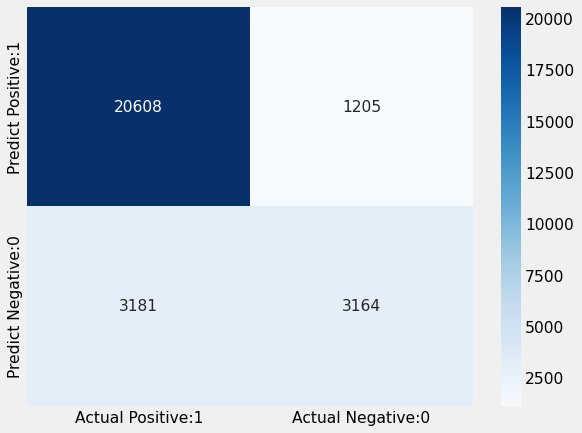

In [183]:
cm_matrix = pd.DataFrame(data=cm, columns=['Actual Positive:1', 'Actual Negative:0'], 
                                 index=['Predict Positive:1', 'Predict Negative:0'])

sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='Blues')

## 18.  Classification Metrices 

`Classification report` is another way to evaluate the classification model performance. It displays the precision, recall, f1 and support scores for the model. I have described these terms in later.

We can print a classification report as follows:-

In [184]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred_test))

              precision    recall  f1-score   support

          No       0.87      0.94      0.90     21813
         Yes       0.72      0.50      0.59      6345

    accuracy                           0.84     28158
   macro avg       0.80      0.72      0.75     28158
weighted avg       0.83      0.84      0.83     28158



### 18.1 Classification Accuracy 

In [185]:
TP = cm[0,0]
TN = cm[1,1]
FP = cm[0,1]
FN = cm[1,0]

### 18.2 Print classification accuracy


In [186]:
classification_accuracy = (TP + TN) / float(TP + TN + FP + FN)

print('Classification accuracy : {0:0.4f}'.format(classification_accuracy))

Classification accuracy : 0.8442


### 18.3 Classification Error

In [187]:
classification_error = (FP + FN) / float(TP + TN + FP + FN)

print('Classification error : {0:0.4f}'.format(classification_error))

Classification error : 0.1558


### 18.4 Precision 

Precision can be defined as the percentage of correctly predicted positive outcomes out of all the predicted positive outcomes. It can be given as the ratio of true positives (TP) to the sum of true and false positives (TP + FP).

So, Precision identifies the proportion of correctly predicted positive outcome. It is more concerned with the positive class than the negative class.

Mathematically, precision can be defined as the ratio of `TP to (TP + FP)`

In [188]:
precision = TP / float(TP + FP)


print('Precision : {0:0.4f}'.format(precision))

Precision : 0.9448


### 18.5 Recall 

Recall can be defined as the percentage of correctly predicted positive outcomes out of all the actual positive outcomes. It can be given as the ratio of true positives (TP) to the sum of true positives and false negatives (TP + FN). Recall is also called Sensitivity.

Recall identifies the proportion of correctly predicted actual positives.

Mathematically, recall can be given as the ratio of TP to (TP + FN).

In [189]:
recall = TP / float(TP + FN)

print('Recall or Sensitivity : {0:0.4f}'.format(recall))

Recall or Sensitivity : 0.8663


### 18.6 `True Positive Rate` is synonymous with `Recall`.

In [190]:
true_positive_rate = TP / float(TP + FN)


print('True Positive Rate : {0:0.4f}'.format(true_positive_rate))

True Positive Rate : 0.8663


### 18.7 False Positive Rate 

In [191]:
false_positive_rate = FP / float(FP + TN)


print('False Positive Rate : {0:0.4f}'.format(false_positive_rate))

False Positive Rate : 0.2758


### 18.8 Specificity 

In [192]:
specificity = TN / (TN + FP)

print('Specificity : {0:0.4f}'.format(specificity))

Specificity : 0.7242


### 18.9 f1-score 

f1-score is the weighted harmonic mean of precision and recall. The best possible f1-score would be 1.0 and the worst would be 0.0. f1-score is the harmonic mean of precision and recall. So, f1-score is always lower than accuracy measures as they embed precision and recall into their computation. The weighted average of f1-score should be used to compare classifier models, not global accuracy.

### 18.10 Support

Support is the actual number of occurrences of the class in our dataset.

## 19. Adjusting the threshold level

### 19.1 Print the first 10 predicted probabilities of two classes- 0 and 1

In [193]:
y_pred_prob = model.predict_proba(X_test)[0:10]

y_pred_prob

array([[0.91477843, 0.08522157],
       [0.8289691 , 0.1710309 ],
       [0.82098747, 0.17901253],
       [0.95956616, 0.04043384],
       [0.9855958 , 0.0144042 ],
       [0.55186768, 0.44813232],
       [0.90869366, 0.09130634],
       [0.83611259, 0.16388741],
       [0.4058519 , 0.5941481 ],
       [0.27436048, 0.72563952]])

#### Observations

* In each row, the numbers sum to 1.


* There are 2 columns which correspond to 2 classes - 0 and 1.


     Class 0 - predicted probability that there is no rain tomorrow.   
     Class 1 - predicted probability that there is rain tomorrow.
     

* Importance of predicted probabilities

   * We can rank the observations by probability of rain or no rain.

* Predict_proba process

   * Predicts the probabilities 
   * Choose the class with the highest probability

* Classification threshold level

    * There is a classification threshold level of 0.5.
    * Class 1 - probability of rain is predicted if probability > 0.5.
    * Class 0 - probability of no rain is predicted if probability < 0.5.

### 19.2 Store the probabilities in dataframe


In [194]:
y_pred_prob_df = pd.DataFrame(data=y_pred_prob, columns=['Prob of - No rain tomorrow (0)', 'Prob of - Rain tomorrow (1)'])

y_pred_prob_df

,Prob of - No rain tomorrow (0),Prob of - Rain tomorrow (1)
0,0.914778,0.085222
1,0.828969,0.171031
2,0.820987,0.179013
3,0.959566,0.040434
4,0.985596,0.014404
5,0.551868,0.448132
6,0.908694,0.091306
7,0.836113,0.163887
8,0.405852,0.594148
9,0.274360,0.725640


#### Print the first 10 predicted probabilities for class 1 - Probability of rain

In [195]:
model.predict_proba(X_test)[0:10, 1]

array([0.08522157, 0.1710309 , 0.17901253, 0.04043384, 0.0144042 ,
       0.44813232, 0.09130634, 0.16388741, 0.5941481 , 0.72563952])

#### Store the predicted probabilities for class 1 - Probability of rain

In [196]:
y_pred1 = model.predict_proba(X_test)[:, 1]

### 19.3 Plot histogram of predicted probabilities


Text(0, 0.5, 'Frequency')

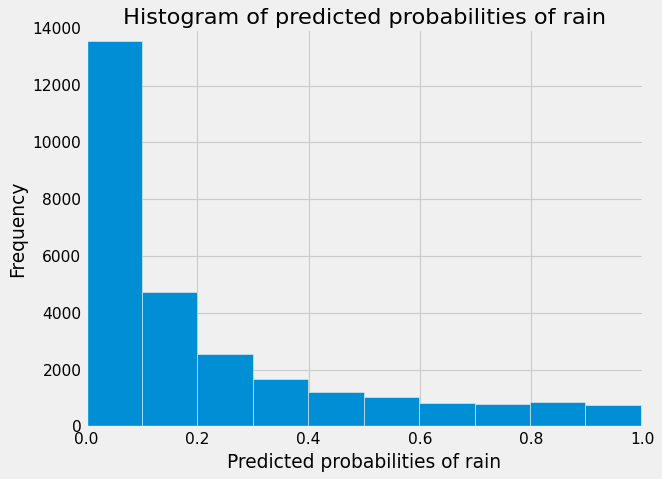

In [197]:
plt.hist(y_pred1, bins = 10)
plt.title('Histogram of predicted probabilities of rain')
plt.xlim(0,1)

plt.xlabel('Predicted probabilities of rain')
plt.ylabel('Frequency')

#### Observations

* We can see that the above histogram is `highly positive skewed.`

* The first column tell us that there are approximately 15000 observations with probability between 0.0 and 0.1.

* There are small number of observations with probability > 0.5.

* So, these small number of observations predict that there will be rain tomorrow.

* Majority of observations predict that there will be no rain tomorrow.

### 19.4 Lower the threshold

In [198]:
from sklearn.preprocessing import binarize

for i in range(1,5):
    
    cm1=0
    
    y_pred1 = model.predict_proba(X_test)[:,1]
    
    y_pred1 = y_pred1.reshape(-1,1)
    
    y_pred2 = binarize(y_pred1, i/10)
    
    y_pred2 = np.where(y_pred2 == 1, 'Yes', 'No')
    
    cm1 = confusion_matrix(y_test, y_pred2)
        
    print ('With',i/10,'threshold the Confusion Matrix is ','\n\n',cm1,'\n\n',
           
            'with',cm1[0,0]+cm1[1,1],'correct predictions, ', '\n\n', 
           
            cm1[0,1],'Type I errors( False Positives), ','\n\n',
           
            cm1[1,0],'Type II errors( False Negatives), ','\n\n',
           
           'Accuracy score: ', (accuracy_score(y_test, y_pred2)), '\n\n',
           
           'Sensitivity: ',cm1[1,1]/(float(cm1[1,1]+cm1[1,0])), '\n\n',
           
           'Specificity: ',cm1[0,0]/(float(cm1[0,0]+cm1[0,1])),'\n\n',
          
            '====================================================', '\n\n')

With 0.1 threshold the Confusion Matrix is  

 [[12999  8814]
 [  517  5828]] 

 with 18827 correct predictions,  

 8814 Type I errors( False Positives),  

 517 Type II errors( False Negatives),  

 Accuracy score:  0.6686199303927836 

 Sensitivity:  0.9185185185185185 

 Specificity:  0.595929033145372 



With 0.2 threshold the Confusion Matrix is  

 [[17026  4787]
 [ 1257  5088]] 

 with 22114 correct predictions,  

 4787 Type I errors( False Positives),  

 1257 Type II errors( False Negatives),  

 Accuracy score:  0.7853540734427161 

 Sensitivity:  0.8018912529550828 

 Specificity:  0.7805437124650437 



With 0.3 threshold the Confusion Matrix is  

 [[18928  2885]
 [ 1946  4399]] 

 with 23327 correct predictions,  

 2885 Type I errors( False Positives),  

 1946 Type II errors( False Negatives),  

 Accuracy score:  0.8284324170750763 

 Sensitivity:  0.6933018124507486 

 Specificity:  0.8677394214459268 



With 0.4 threshold the Confusion Matrix is  

 [[19963  1850

#### Comments

* In binary problems, the threshold of 0.5 is used by default to convert predicted probabilities into class predictions.

* Threshold can be adjusted to increase sensitivity or specificity.

* Sensitivity and specificity have an inverse relationship. Increasing one would always decrease the other and vice versa.

* We can see that increasing the threshold level results in increased accuracy.

* Adjusting the threshold level should be one of the last step you do in the model-building process.


## 20. ROC - AUC

#### ROC Curve

Another tool to measure the `classification model performance` visually is ROC Curve. ROC Curve stands for `Receiver Operating Characteristic Curve`. An ROC Curve is a plot which shows the performance of a classification model at various classification threshold levels.

The ROC Curve plots the `True Positive Rate` (TPR) against the `False Positive Rate (FPR)` at various threshold levels.

True Positive Rate (TPR) is also called Recall. It is defined as the ratio of TP to (TP + FN).

False Positive Rate (FPR) is defined as the ratio of FP to (FP + TN).

In the ROC Curve, we will focus on the TPR (True Positive Rate) and FPR (False Positive Rate) of a single point. This will give us the general performance of the ROC curve which consists of the TPR and FPR at various threshold levels. So, an ROC Curve plots TPR vs FPR at different classification threshold levels. If we lower the threshold levels, it may result in more items being classified as positve. It will increase both True Positives (TP) and False Positives (FP).

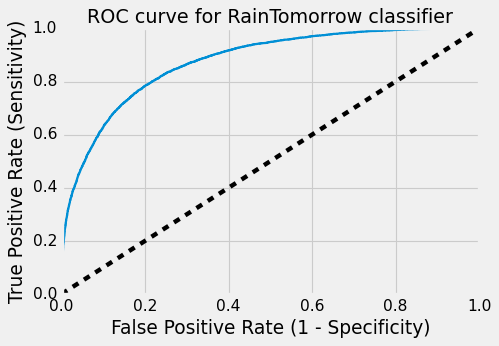

In [199]:
from sklearn.metrics import roc_curve

fpr, tpr, thresholds = roc_curve(y_test, y_pred1, pos_label = 'Yes')

plt.figure(figsize=(6,4))

plt.plot(fpr, tpr, linewidth=2)

plt.plot([0,1], [0,1], 'k--' )

plt.rcParams['font.size'] = 12

plt.title('ROC curve for RainTomorrow classifier')

plt.xlabel('False Positive Rate (1 - Specificity)')

plt.ylabel('True Positive Rate (Sensitivity)')

plt.show()

ROC curve help us to choose a threshold level that balances sensitivity and specificity for a particular context.

#### Compute ROC AUC

In [200]:
from sklearn.metrics import roc_auc_score

ROC_AUC = roc_auc_score(y_test, y_pred1)

print('ROC AUC : {:.4f}'.format(ROC_AUC))

ROC AUC : 0.8751


#### Comments

ROC AUC is a single number summary of classifier performance. The higher the value, the better the classifier.

ROC AUC of our model approaches towards 1. So, we can conclude that our classifier does a good job in predicting whether it will rain tomorrow or not.

## 21. Model evaluation and improvement

In this section, I will employ several techniques to improve the model performance. I will discuss 2 techniques which are used in practice for performance improvement. These are `k-fold cross validation` and `hyperparameter optimization using GridSearchCV.`

### 21.1 k-Fold Cross Validation 

Cross-validation is primarily used in applied machine learning to estimate the skill of a machine learning model on unseen data. That is, to use a limited sample in order to estimate how the model is expected to perform in general when used to make predictions on data not used during the training of the model.

<img src="https://zitaoshen.rbind.io/project/machine_learning/machine-learning-101-cross-vaildation/featured.png" width="480">


##### Applying 5-Fold Cross Validation

In [201]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(model, X_train, y_train, cv = 5, scoring='accuracy')

print('Cross-validation scores:{}'.format(scores))

Cross-validation scores:[0.85017313 0.85239279 0.84999556 0.85083903 0.8554495 ]


We can summarize the cross-validation accuracy by calculating its `mean`.

##### Compute Average cross-validation score


In [202]:
print('Average cross-validation score: {:.4f}'.format(scores.mean()))

Average cross-validation score: 0.8518


Our, original model score is found to be 0.8523. The average cross-validation score is 0.8518. So, we can conclude that cross-validation does not result in performance improvement.

### 21.2 Hyperparameter Optimization using GridSearch CV 


  <img src="https://miro.medium.com/max/700/1*yHNmVkf43eTJF5QDebUltQ.png" width="480">

    
    

In [203]:
from sklearn.model_selection import GridSearchCV

In [204]:
parameters = [{'penalty':['l1','l2']}, 
              {'C':[1, 10, 100, 1000]}]

In [205]:
grid_search = GridSearchCV(estimator = model,param_grid = parameters,scoring = 'accuracy',cv = 5,verbose=0)

In [206]:
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=LogisticRegression(random_state=0, solver='liblinear'),
             param_grid=[{'penalty': ['l1', 'l2']}, {'C': [1, 10, 100, 1000]}],
             scoring='accuracy')

#### Examine the best model

##### Best score achieved during the GridSearchCV

In [207]:
print('GridSearch CV best score : {:.4f}\n\n'.format(grid_search.best_score_))

GridSearch CV best score : 0.8520




##### Print parameters that give the best results

In [208]:
print('Parameters that give the best results :','\n\n', (grid_search.best_params_))

Parameters that give the best results : 

 {'C': 10}


##### Print estimator that was chosen by the GridSearch

In [209]:
print('\n\nEstimator that was chosen by the search :','\n\n', (grid_search.best_estimator_))



Estimator that was chosen by the search : 

 LogisticRegression(C=10, random_state=0, solver='liblinear')


##### Calculate GridSearch CV score on test set

In [210]:
print('GridSearch CV score on test set: {0:0.4f}'.format(grid_search.score(X_test, y_test)))

GridSearch CV score on test set: 0.8446


#### Comments

Our original model test accuracy is `0.8442` while GridSearch CV accuracy is `0.8446`.

We can see that GridSearch CV slightly improve the performance for this particular model.


# -------------------------------------------------------------------------------------

# 22 Results and Conclusion 

1. The logistic regression model accuracy score is 0.8446. So, the model does a very good job in predicting whether or not it will rain tomorrow in Australia.

2. Small number of observations predict that there will be rain tomorrow. Majority of observations predict that there will be no rain tomorrow.

3. The model shows no signs of overfitting.

4. If we use more regularized model by setting C=0.01, then both the training and test set accuracy decrease relative to the default parameters.

5. Increasing the threshold level results in increased accuracy.

6. ROC AUC of our model approaches towards 1. So, we can conclude that our classifier does a good job in predicting whether it will rain tomorrow or not.

7. Our, original model score is found to be 0.8476. The average cross-validation score is 0.8474. So, we can conclude that cross-validation does not result in performance improvement.

8. Our original model test accuracy is 0.8442 while GridSearch CV accuracy is 0.8446. We can see that GridSearch CV slightly improve the performance for this particular model.